# Analysis & Visualization of Produced Water Chemistry for Environmental & Agricultural Utilization

## SETUP

In [86]:
# Dependencies
import os
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress
import numpy as np

import geopandas as gpd
import folium
from folium.plugins import MarkerCluster
import seaborn as sns
from sklearn.linear_model import LinearRegression
import math
from sklearn.preprocessing import scale
from branca.element import Element
import branca.colormap as cm
from branca.colormap import linear

from wqchartpy import triangle_piper
from triangle_piper_modified import plot as triangle_piper_mod
from wqchartpy import contour_piper
from contour_piper_modified import plot as contour_piper_mod
from wqchartpy import color_piper

import warnings
warnings.filterwarnings("ignore")


## DATA CLEANING & FILTERING

### Read in CSV Files & Merge to Initial Raw Dataframe

In [87]:
# Load the data from the CSV files
df1 = pd.read_csv('../data/split_1_USGSPWDBv2.3n.csv', low_memory=False)
df2 = pd.read_csv('../data/split_2_USGSPWDBv2.3n.csv', low_memory=False)
df3 = pd.read_csv('../data/split_3_USGSPWDBv2.3n.csv', low_memory=False)

# Concatenate the dataframes
frames = [df1, df2, df3]
df_merged = pd.concat(frames, ignore_index=True)

# Save the concatenated dataframe to a new CSV file
df_merged.to_csv('../data/df_csv_files/df_merged.csv', index=False)


### Adjust Columns

In [88]:
# List of columns to be removed
columns_to_remove = [
    "IDDB", "SOURCE", "REFERENCE", "LATLONGAPX", "USGSREGION", "BASINCODE", 
    "STATECODE", "COUNTYCODE", "FIELD", "FIELDCODE", "WELLCODE", "TOWNRANGE", 
    "REGDIST", "LOC", "QUAD", "DAY", "DATECOMP", "DATEANALYS", "METHOD", 
    "OPERATOR", "PERMIT", "DFORM", "GROUP", "MEMBER", "AGECODE", "ERA", 
    "PERIOD", "EPOCH", "LAB", "REMARKS", "LITHOLOGY", "POROSITY", "TEMP", 
    "PRESSURE", "SG", "SPGRAV", "SPGRAVT", "RESIS", "RESIST", "PH", "PHT", 
    "EHORP", "COND", "CONDT", "TURBIDITY", "HEM", "MBAS","TDS","TDSCALC", "TSS", "CHARGEBAL", 
    "ACIDITY", "DIC", "DOC", "TOC", "CN", "BOD", "COD", "BENZENE", "TOLUENE", 
    "ETHYLBENZ", "XYLENE", "ACETATE", "BUTYRATE", "FORMATE", "LACTATE", 
    "PHENOLS", "PERC", "PROPIONATE", "PYRUVATE", "VALERATE", "ORGACIDS", 
    "Ar", "CH4", "C2H6", "CO2", "H2", "H2S", "He", "N2", "NH3", "O2", "ALPHA", 
    "BETA", "dD", "H3", "d7Li", "d11B", "d13C", "C14", "d18O", "d34S", 
    "d37Cl", "K40", "d81Br", "Sr87Sr86", "I129", "Rn222", "Ra226", "Ra228", 
    "cull_PH", "cull_MgCa", "cull_KCl", "cull_K5Na", "Ag", "Al", "As", "Au", 
    "B", "BO3", "Be", "Bi", "Cd", "Co", "Cr", "Cs", "Cu", "F", "FeS", "FeAl", 
    "FeAl2O3", "Hg", "I", "Mn", "Mo", "N", "NO2", "NO3", "NO3NO2", "NH4", 
    "TKN", "Ni", "OH", "P", "PO4", "Pb", "Rh", "Rb", "S", "SO3", "HS", "Sb", 
    "Sc", "Se", "Sn", "Ti", "Tl", "U", "V", "W", "Zn"
]

# Remove the specified columns
df_limited_column = df_merged.drop(columns=columns_to_remove, errors='ignore')

# Display the updated merged dataframe
df_limited_column.to_csv('../data/df_csv_files/df_limited_column.csv', index=False)


In [89]:
# Add column "BASIN_CATEGORY" to df_filtered to aid in later filtering

# Define the basin categories
basin_categories = {
    'Anadarko Basin': ['Amarillo Arch', 'Anadarko', 'Anadarko - Chautauqua Platform', 'Anadarko - Southern Oklahoma'],
    'Appalachian Basin': ['Appalachian', 'Black Warrior'],
    'Gulf Coast Basin': ['Arkla', 'Gulf Coast'],
    'Oklahoma Platform Basins': ['Arkoma', 'Arkoma - Chautauqua Platform', 'Central Kansas Uplift', 
                                                'Chautauqua Platform', 'Cherokee', 'Kansas Basins', 'Nemaha Uplift', 
                                                'Sedgwick', 'Southern Oklahoma'],
    'Fort Worth Basin': ['Bend Arch', 'Fort Worth'],
    'Rocky Mountain Basins': ['Big Horn', 'Black Mesa', 'Denver', 'Green River', 'Paradox', 'Piceance', 
                              'Powder River', 'San Juan', 'Uinta', 'Wind River'],
    'Illinois Basin': ['Illinois'],
    'Michigan Basin': ['Michigan'],
    'Permian Basin': ['Palo Duro', 'Permian'],
    'Williston Basin': ['Williston']
}

# Create a reverse mapping from specific basin to category
basin_to_category = {specific: category for category, specifics in basin_categories.items() for specific in specifics}

df_basins_categorized = df_limited_column.copy()

# Map the 'BASIN' column to a new 'BASIN_CATEGORY' column
df_basins_categorized['BASIN_CATEGORY'] = df_basins_categorized['BASIN'].map(basin_to_category)

# Drop rows that don't have a basin category (i.e., not in your list)
df_basins_categorized = df_basins_categorized.dropna(subset=['BASIN_CATEGORY'])

# Save the filtered dataframe to a new CSV file
df_basins_categorized.to_csv('../data/df_csv_files/df_basins_categorized.csv', index=False)


### Technical Cleaning Steps

In [90]:
# Remove rows where TDSUSGS <= 35000 (sea water to eliminate all coalebed methane produced water and also the failing analyses)
df_filtered = df_basins_categorized[df_basins_categorized['TDSUSGS'] > 35000]

# Save the filtered dataframe to a new CSV file
df_filtered.to_csv('../data/df_csv_files/df_filtered_TDS.csv', index=False)


In [91]:
# Fill NaN values in 'KNa', 'K', 'Na', 'Ca', 'Cl', 'SO4', 'Mg' with zeros for calculation
for col in ['KNa', 'K', 'Na', 'Ca', 'Cl', 'SO4', 'Mg']:
    df_filtered[col].fillna(0, inplace=True)

# First, we'll fill NaN values in 'KNa' and 'K' with zeros for the calculation.
df_filtered['KNa'].fillna(0, inplace=True)
df_filtered['K'].fillna(0, inplace=True)

# Apply conditions to calculate 'Na'
# If 'Na' is missing and both 'KNa' and 'K' are present, populate 'Na' with 'KNa' - 'K'
# If 'Na' is missing and 'KNa' is present but 'K' is not, populate 'Na' with 'KNa'

na_mask = df_filtered['Na'].isna()
na_present = df_filtered['Na'] > 0
kna_present = df_filtered['KNa'] > 0
k_present = df_filtered['K'] > 0
k_missing = df_filtered['K'] == 0

df_filtered.loc[k_missing & na_present & kna_present, 'K'] = df_filtered['KNa'] - df_filtered['Na']
df_filtered.loc[na_mask & kna_present & k_present, 'Na'] = df_filtered['KNa'] - df_filtered['K']
df_filtered.loc[na_mask & kna_present & ~k_present, 'Na'] = df_filtered['KNa']

# Remove rows where 'Na' is still missing
df_filtered.dropna(subset=['Na'], inplace=True)

# Remove rows where 'Cl' is missing
df_filtered.dropna(subset=['Cl'], inplace=True)

# Save the updated dataframe 
df_filtered.to_csv('../data/df_csv_files/df_filtered_Na_Cl.csv', index=False)


In [92]:
#To calculate the molar concentrations from concentrations given in ppm (parts per million) or mg/L,
#these values need to be converted into moles per liter (M). The formula to convert ppm or mg/L to M is:

                #Molarity (M)=Concentration (mg/L)/ Molar Mass (g/mol) 

#This calculation assumes that 1 ppm is equivalent to 1 mg/L. The molar mass of each element or compound (Na, Ca, Cl, SO4, and Mg) 
#is a constant value based on its atomic or molecular weight.

#Apply the conditions (molar Na > molar Ca) and (molar Cl > molar SO4) and (molar Ca > molar Mg/2) which represent likely unnatural combinations
# Convert concentrations from ppm (mg/L) to Molarity (M)
molar_masses = {'Na': 22.99, 'Ca': 40.08, 'Cl': 35.45, 'SO4': 96.06, 'Mg': 24.305}
for element, molar_mass in molar_masses.items():
    df_filtered[element + '_M'] = df_filtered[element] / molar_mass

# Apply the conditions (molar Na > molar Ca) and (molar Cl > molar SO4) and (molar Ca > molar Mg/2)
condition = (df_filtered['Na_M'] > df_filtered['Ca_M']) & \
            (df_filtered['Cl_M'] > df_filtered['SO4_M']) & \
            (df_filtered['Ca_M'] > df_filtered['Mg_M'] / 2)

df_filtered = df_filtered[condition]

# Save the updated dataframe
df_filtered.to_csv('../data/df_csv_files/df_filtered_corrected_elemental_ratios.csv', index=False)


In [93]:
# Filter out rows where USGS charge balance is not between -10 and +10
df_filtered = df_filtered[df_filtered['chargebalance'].between(-10, 10)]

# Save the updated dataframe
df_filtered.to_csv('../data/df_csv_files/df_filtered_chargebalance.csv', index=False)


In [94]:
# Calculate charge balance
df_filtered['Cations'] = (df_filtered['Na_M'] * 1) + (df_filtered['Ca_M'] * 2) + (df_filtered['Mg_M'] * 2)
df_filtered['Anions'] = (df_filtered['Cl_M'] * 1) + (df_filtered['SO4_M'] * 2)
df_filtered['CalculatedChargeBalance'] = ((df_filtered['Cations'] - df_filtered['Anions']) / (df_filtered['Cations'] + df_filtered['Anions'])) * 100

# Flag discrepancies between calculated charge balance and existing 'chargebalance' column
threshold = 5  # 5% threshold for discrepancy
df_filtered['ChargeBalanceDiscrepancy'] = abs(df_filtered['CalculatedChargeBalance'] - df_filtered['chargebalance']) > threshold

# Save the updated dataframe with discrepancy flags
df_filtered.to_csv('../data/df_csv_files/df_filtered_discrepancy_flags.csv', index=False)


In [95]:
#Replace missing CO3 with 0's
df_filtered['CO3'].fillna(0, inplace=True)

#Replace missing HCO3 with ALKHCO3 where available
df_filtered['HCO3'].fillna(df_filtered['ALKHCO3'], inplace=True)

#Calculate HCO3 if both HCO3 and ALKHCO3 are missing
mask = df_filtered['HCO3'].isna() & df_filtered['ALKHCO3'].isna()
df_filtered.loc[mask, 'HCO3'] = (df_filtered['Cations'] - df_filtered['Anions']) / 61.0702

# Save the updated dataframe with estimated HCO3
df_filtered.to_csv('../data/df_csv_files/df_filtered_estimated_HCO3.csv', index=False)


### Filtered Dataframe Variations

In [96]:
# Create version of df_filtered that drops all columns without a basin category

df_filtered_categorized_basin = df_filtered.copy()

# Drop rows that don't have a basin category 
df_filtered_categorized_basin = df_filtered_categorized_basin.dropna(subset=['BASIN_CATEGORY'])

# Save the filtered dataframe to a new CSV file
df_filtered_categorized_basin.to_csv('../data/df_csv_files/df_filtered_categorized_basin.csv', index=False)


In [97]:
# Create version of df_filtered with only the most recent sample from each well

# Convert 'DATESAMPLE' to DateTime format for rows where it's available
df_filtered['DATESAMPLE'] = pd.to_datetime(df_filtered['DATESAMPLE'], errors='coerce')

# Split the DataFrame into two: one where DATESAMPLE is available, and one where it's missing
df_with_date = df_filtered.dropna(subset=['DATESAMPLE'])
df_without_date = df_filtered[df_filtered['DATESAMPLE'].isna()]

# For wells with dates, find the index of the most recent sample
idx_with_date = df_with_date.groupby('WELLNAME')['DATESAMPLE'].idxmax()

# For wells without dates, simply take the last occurrence
idx_without_date = df_without_date.groupby('WELLNAME').tail(1).index

# Combine the indices
combined_idx = idx_with_date.tolist() + idx_without_date.tolist()

# Use the combined indices to filter the DataFrame
df_filtered_recent = df_filtered.loc[combined_idx]

# Save the filtered dataframe to a new CSV file
df_filtered_recent.to_csv('../data/df_csv_files/df_filtered_recent.csv', index=False)


In [98]:
# Create version of df_filtered_recent that drops all columns without a basin category

df_filtered_recent_categorized_basin = df_filtered_recent.copy()

# Drop rows that don't have a basin category 
df_filtered_recent_categorized_basin = df_filtered_recent_categorized_basin.dropna(subset=['BASIN_CATEGORY'])

# Save the filtered dataframe to a new CSV file
df_filtered_recent_categorized_basin.to_csv('../data/df_csv_files/df_filtered_recent_categorized_basin.csv', index=False)


## ANALYSIS 

### Descriptive Statistics

In [99]:
#Descriptive Statistics of columns with numerical data
descriptive_stats = df_filtered.describe()
descriptive_stats


,IDUSGS,LATITUDE,LONGITUDE,TIMESERIES,DATESAMPLE,DEPTHUPPER,DEPTHLOWER,DEPTHWELL,ELEVATION,TDSUSGS,chargebalance,Ba,Br,CO3,HCO3,Ca,Cl,FeTot,FeIII,FeII,K,KNa,Li,Mg,Na,SO4,Si,Sr,ALKHCO3,Na_M,Ca_M,Cl_M,SO4_M,Mg_M,Cations,Anions,CalculatedChargeBalance
count,46568.000000,40456.000000,40693.000000,66.000000,33885,37711.000000,32477.000000,19634.000000,11481.000000,46568.000000,46568.000000,5881.000000,3634.000000,46568.000000,46568.000000,46568.000000,46568.000000,12619.000000,205.000000,328.000000,46568.00000,46568.000000,2886.000000,46568.000000,46568.000000,46568.000000,1825.000000,4811.000000,706.000000,46568.000000,46568.000000,46568.000000,46568.000000,46568.000000,46568.000000,46568.000000,46568.000000
mean,56730.645164,37.364217,-97.708347,6.000000,1965-12-04 03:04:21.035856560,6371.373993,6708.026184,7121.064047,1752.774061,162857.364220,-0.026982,230.334740,869.234089,22.811334,321.442235,9851.594495,97770.464964,88.857232,103.664878,139.744329,452.10793,3.385600,39.614413,1586.952093,49317.788612,906.239668,55.047435,663.073582,459.366613,2145.184368,245.798266,2757.982086,9.434100,65.293236,2767.367371,2776.850287,-0.025168
min,65.000000,26.022340,-111.140870,1.000000,1905-01-01 00:00:00,8.000000,125.000000,100.000000,0.000000,35006.000000,-10.000000,0.000856,0.200000,0.000000,-33.126360,3.000000,663.000000,0.030000,0.100000,0.100000,0.00000,0.000000,0.007100,0.000000,1740.000000,0.000000,0.400000,0.142090,4.000000,75.685080,0.074850,18.702398,0.000000,0.000000,78.934473,18.702398,-88.904190
25%,31757.750000,31.960900,-102.860840,3.000000,1955-06-14 00:00:00,3570.000000,3996.000000,4557.000000,345.000000,84090.000000,0.000000,10.250000,159.000000,0.000000,61.000000,2569.882500,50039.337500,5.000000,0.600000,5.000000,0.00000,0.000000,5.557500,549.000000,27178.025000,36.715000,6.100000,124.980000,100.000000,1182.167247,64.118825,1411.546897,0.382209,22.587945,1436.310987,1432.466251,-0.053417
50%,61977.500000,35.612000,-98.035000,5.000000,1963-07-17 00:00:00,6160.000000,6499.000000,6767.500000,1573.000000,147051.500000,0.000000,43.700000,491.000000,0.000000,162.465000,6699.500000,88600.000000,24.710000,3.000000,30.310000,0.00000,0.000000,14.000000,1202.000000,45514.905000,309.000000,13.100000,339.000000,230.000000,1979.769682,167.153194,2499.294781,3.216740,49.454845,2512.270360,2513.692187,0.029520
75%,81419.250000,43.498275,-93.150200,8.000000,1976-05-13 00:00:00,8888.000000,9140.000000,9210.000000,2546.000000,230184.750000,0.000000,134.000000,1212.207040,0.000000,336.102500,13270.250000,138000.000000,79.855000,30.000000,98.250000,0.00000,0.000000,43.000000,2160.000000,65113.500000,1100.240000,33.000000,900.000000,559.500000,2832.253154,331.094062,3892.806770,11.453675,88.870603,3898.659838,3908.548965,0.167411
max,114811.000000,49.684620,-75.880000,15.000000,2014-03-28 00:00:00,22940.000000,23135.000000,23258.000000,9525.000000,528724.000000,10.000000,22400.000000,10600.000000,151857.000000,55266.000000,84970.000000,327777.156600,10000.000000,3650.000000,4150.000000,75000.00000,67065.000000,1730.000000,25903.860000,149835.850000,22152.000000,5555.000000,13100.000000,6124.272616,6517.435842,2120.009980,9246.182133,230.605871,1065.783172,9140.344880,9246.182133,86.956821
std,30943.257029,6.747505,6.275761,3.687818,NaN,3267.379543,3263.024529,3299.554336,1515.930308,91366.732881,1.158768,941.200393,1084.013258,825.070329,871.633322,10345.970743,55732.337970,297.244074,396.998207,403.006982,1442.99316,431.457694,83.158328,1536.636896,27203.143655,1485.278608,273.108735,915.674409,607.546106,1183.259837,258.133003,1572.139294,15.461988,63.223077,1550.991526,1567.235708,1.785653


In [100]:
#Descriptive Statistics of only elements of primary interest
specific_columns_stats = df_filtered[['Li','Na', 'Mg','Ca', 'Cl', 'SO4', 'HCO3']].describe()
specific_columns_stats


,Li,Na,Mg,Ca,Cl,SO4,HCO3
count,2886.000000,46568.000000,46568.000000,46568.000000,46568.000000,46568.000000,46568.000000
mean,39.614413,49317.788612,1586.952093,9851.594495,97770.464964,906.239668,321.442235
std,83.158328,27203.143655,1536.636896,10345.970743,55732.337970,1485.278608,871.633322
min,0.007100,1740.000000,0.000000,3.000000,663.000000,0.000000,-33.126360
25%,5.557500,27178.025000,549.000000,2569.882500,50039.337500,36.715000,61.000000
50%,14.000000,45514.905000,1202.000000,6699.500000,88600.000000,309.000000,162.465000
75%,43.000000,65113.500000,2160.000000,13270.250000,138000.000000,1100.240000,336.102500
max,1730.000000,149835.850000,25903.860000,84970.000000,327777.156600,22152.000000,55266.000000


### Define Image File Moving Function Used in Later Code

In [101]:
'''
    Because wqchartpy automatically generates the plot image files within the current directory as part of the module code, the following function is needed to push 
    them to our images folder as they're generated to keep our file structure organized automatically. A function was created since this will be used repeatedly.

    Additionally, this helps to consolodate the added complication of needing to go up a folder before going back down for non-wqchartpy images.
'''

def move_image_file_to_images_folder(image_file_name, image_type):
    current_directory = os.getcwd()
    parent_directory = os.path.dirname(current_directory)
    current_file_path = os.path.join(parent_directory, 'notebooks', image_file_name)
    image_folder_path = os.path.join(parent_directory, 'images')
    piper_folder_path = os.path.join(parent_directory, 'images', 'piper_plots')
    geo_folder_path = os.path.join(parent_directory, 'images', 'geo_plots')
    linreg_folder_path = os.path.join(parent_directory, 'images', 'linear_regressions')

    # Check if the images folder exists; if not, it gets created
    if not os.path.exists(image_folder_path):
        os.makedirs(image_folder_path)

    '''
    # Defining function to check if a file with the same name already exists in the destination folder; if so ask user what to do: override with or without deleting the newly generated image
    def prompt_user_if_file_already_exists(image_file_name, destination_folder_name, current_directory, current_file_path):
        if os.path.exists(new_file_path):
            user_input = input(f"A file with the name '{image_file_name}' already exists in '{destination_folder_name}' folder. Do you want to override it? (y/n): ").lower()
        if user_input != 'y':
            user_input = input(f'Do you want to delete the newly generated image file? (y/n): ').lower()
            if user_input == 'y':
                os.remove(current_file_path)
                print('File deleted.')
                return
            else:
                print(f'File not deleted. It is located in {current_directory}.')
            print(f"File not moved to 'images/{destination_folder_name}' folder. It is located in {current_directory}.")
            return
    '''

    if image_type == 'piper':
        
        # Check if image type subfolder exists; if not, it gets created
        if not os.path.exists(piper_folder_path):
            os.makedirs(piper_folder_path)

        new_file_path = os.path.join(piper_folder_path, image_file_name)
        
        '''# Check if a file with the same name already exists in the destination folder; if so ask user what to do: override with or without deleting the newly generated image
        destination_folder_name = 'piper_plots'
        prompt_user_if_file_already_exists(image_file_name, destination_folder_name, current_directory, current_file_path)'''
        
        # Move the file to the destination folder
        os.rename(current_file_path, new_file_path)
        print(f"File '{image_file_name}' moved to 'images/piper_plots' folder.")
        print('---')

    elif image_type == 'geo':
        
        # Check if image type subfolder exists; if not, it gets created
        if not os.path.exists(geo_folder_path):
            os.makedirs(geo_folder_path)

        new_file_path = os.path.join(geo_folder_path, image_file_name)
        
        '''# Check if a file with the same name already exists in the destination folder; if so ask user what to do: override with or without deleting the newly generated image
        destination_folder_name = 'geo_plots'
        prompt_user_if_file_already_exists(image_file_name, destination_folder_name, current_directory, current_file_path)'''
        
        # Move the file to the destination folder
        os.rename(current_file_path, new_file_path)
        print(f"File '{image_file_name}' moved to 'images/geo_plots' folder.")
        print('---')

    elif image_type == 'linreg':
        
        # Check if image type subfolder exists; if not, it gets created
        if not os.path.exists(linreg_folder_path):
            os.makedirs(linreg_folder_path)        

        new_file_path = os.path.join(linreg_folder_path, image_file_name)
        
        '''# Check if a file with the same name already exists in the destination folder; if so ask user what to do: override with or without deleting the newly generated image
        destination_folder_name = 'linear_regressions'
        prompt_user_if_file_already_exists(image_file_name, destination_folder_name, current_directory, current_file_path)'''
        
        # Move the file to the destination folder
        os.rename(current_file_path, new_file_path)
        print(f"File '{image_file_name}' moved to 'images/linear_regressions' folder.")
        print('---')

    elif image_type == 'other':
        # No image type subfolder will be created for 'other' argument; files will be moved to main 'images' folder
        new_file_path = os.path.join(image_folder_path, image_file_name)

        '''# Check if a file with the same name already exists in the destination folder; if so ask user what to do: override with or without deleting the newly generated image
        destination_folder_name = 'images'
        prompt_user_if_file_already_exists(image_file_name, destination_folder_name, current_directory, current_file_path)'''
            
        # Move the file to the destination folder
        os.rename(current_file_path, new_file_path)
        print(f"File '{image_file_name}' moved to 'images' folder.")
        print('---')
        
    else:
        print(f'Invalid image type provided. The available options for image_type are:')
        print(f"'piper', 'geo', 'linreg', 'other'")
        return


### Box & Violin Plots

Please select basin categories by entering their numbers separated by commas:
1: Anadarko Basin
2: Appalachian Basin
3: Gulf Coast Basin
4: Oklahoma Platform Basins
5: Fort Worth Basin
6: Rocky Mountain Basins
7: Illinois Basin
8: Michigan Basin
9: Permian Basin
10: Williston Basin


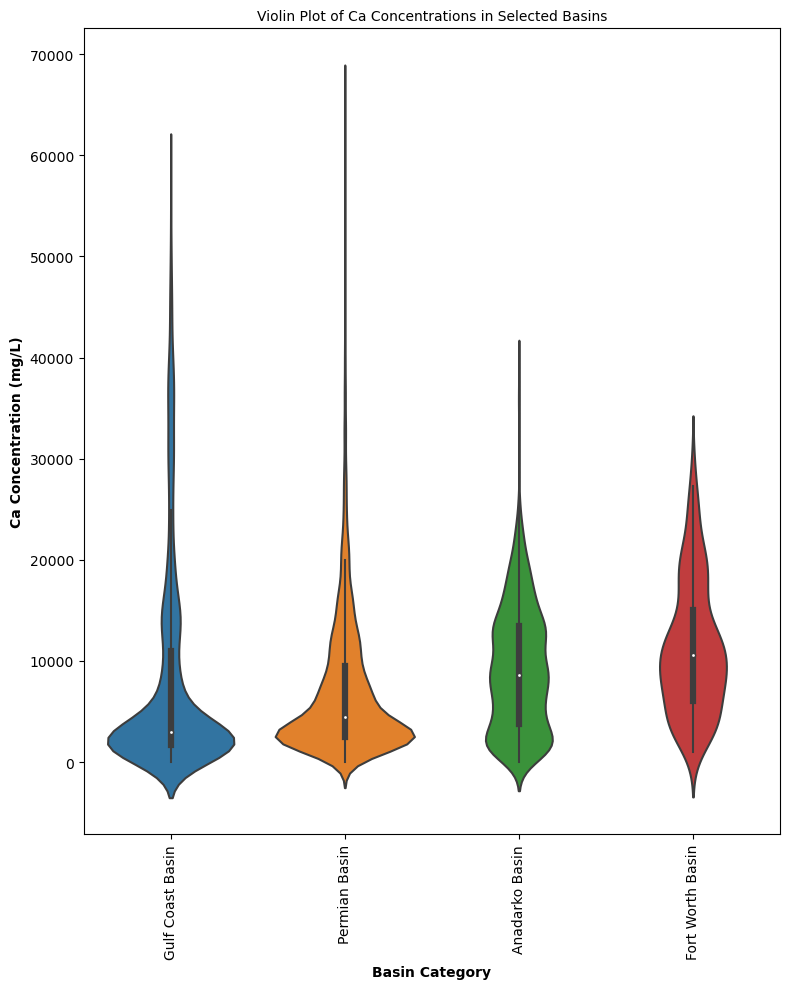

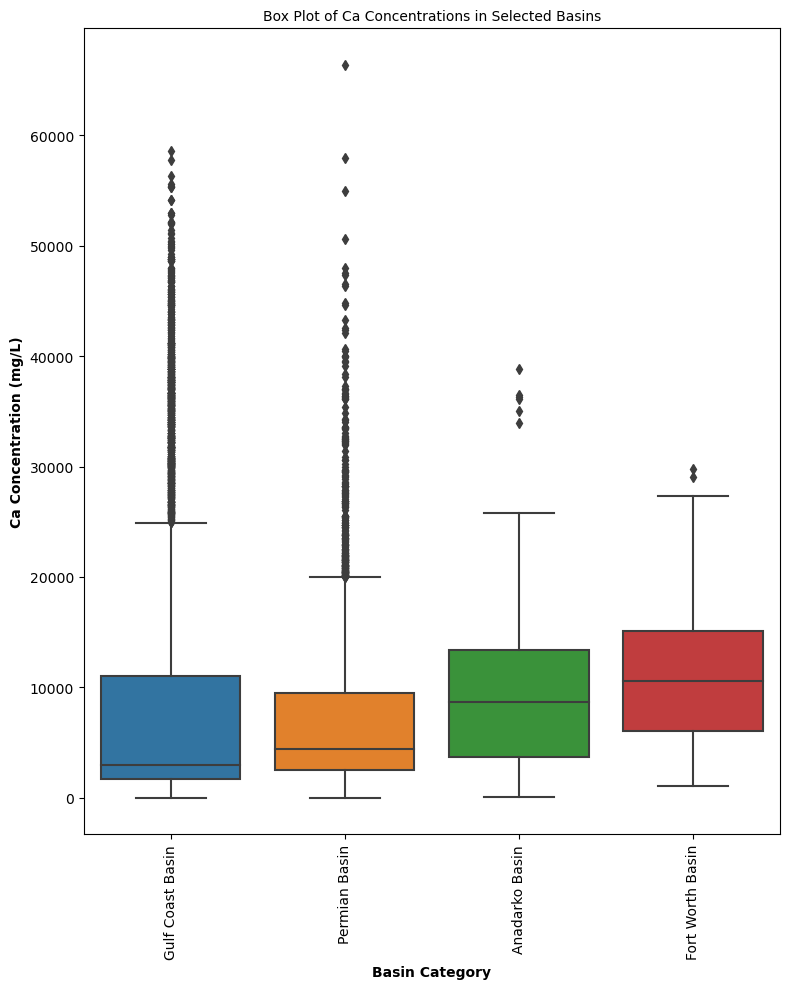

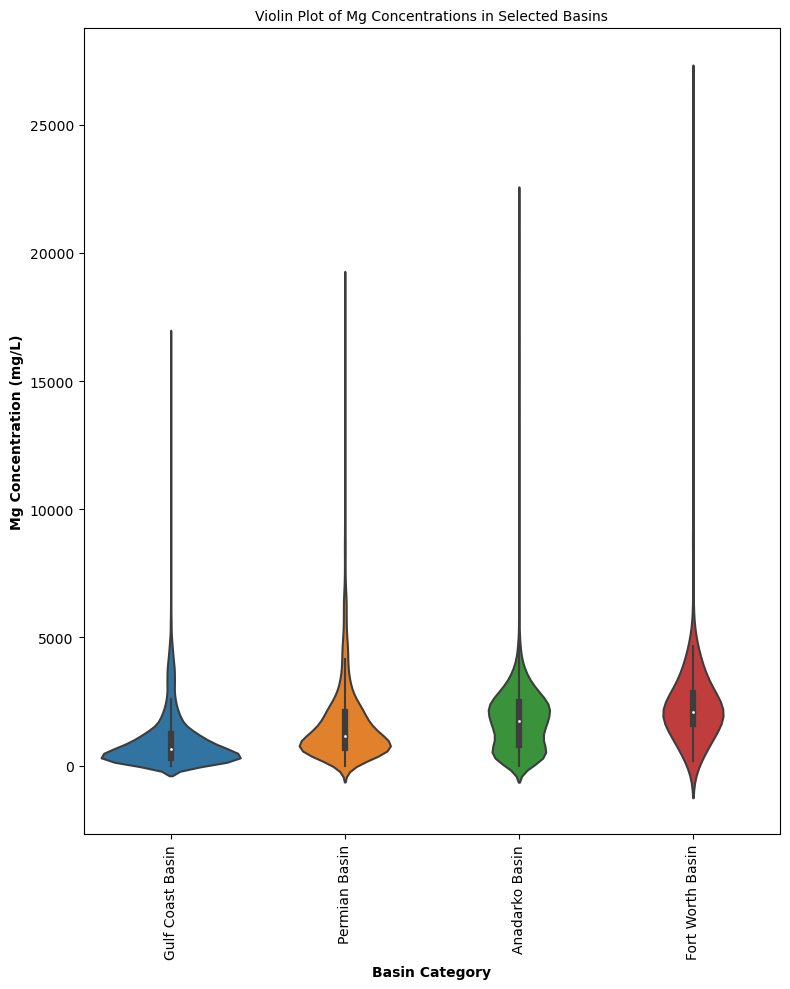

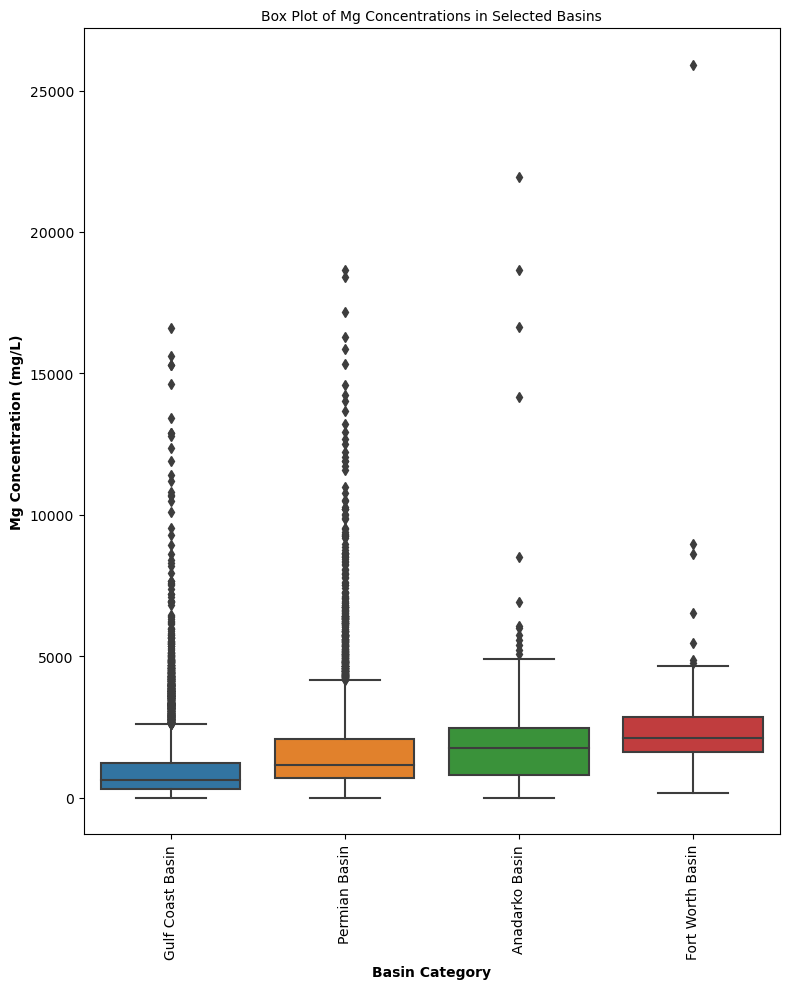

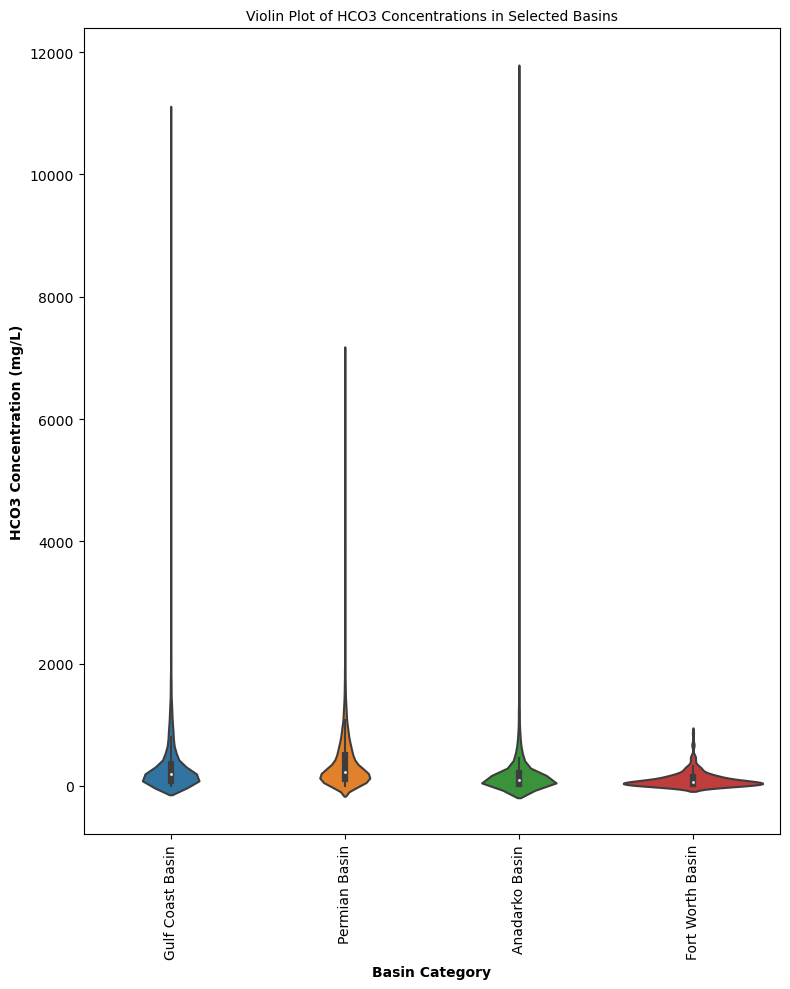

...

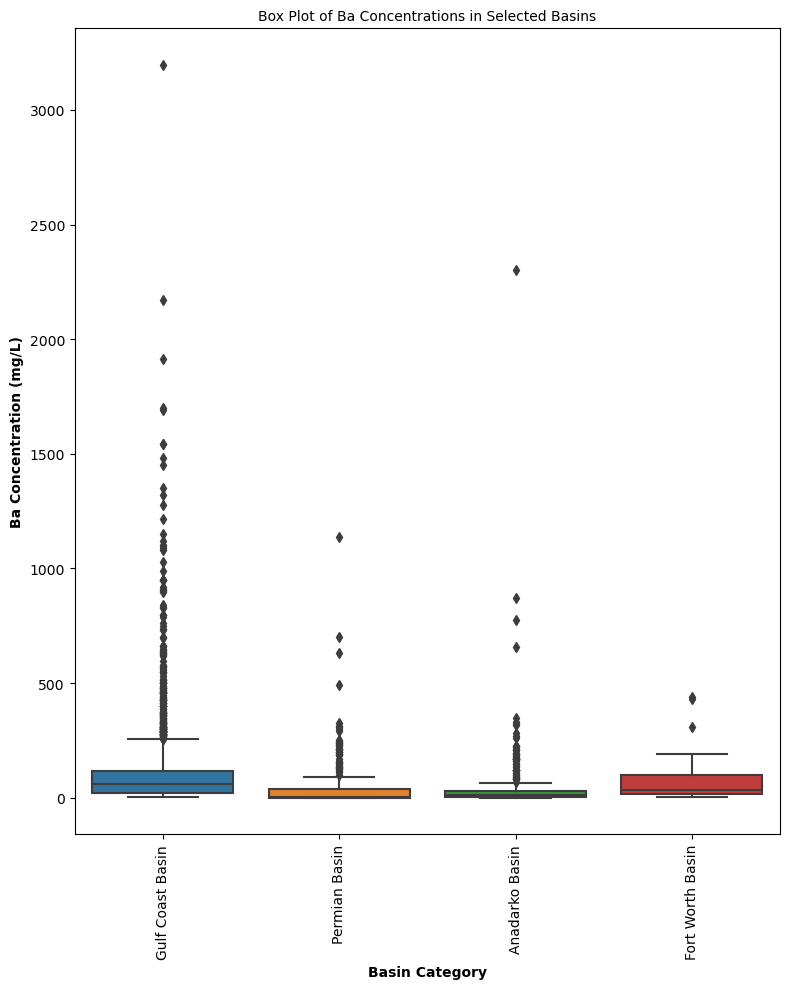

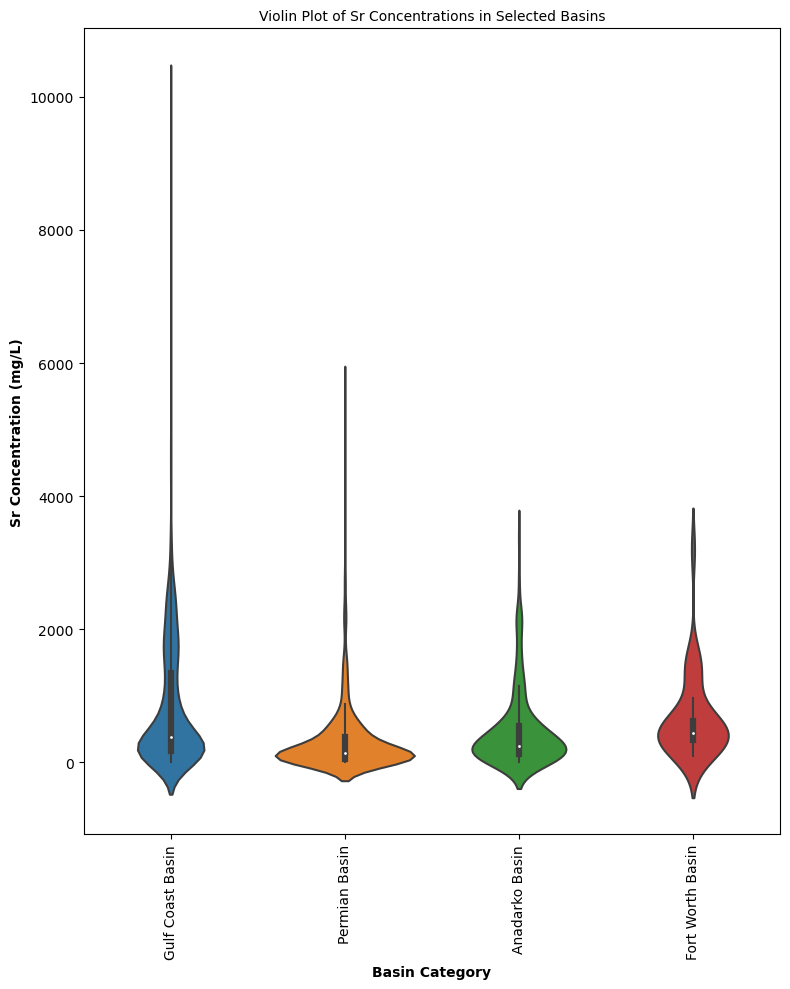

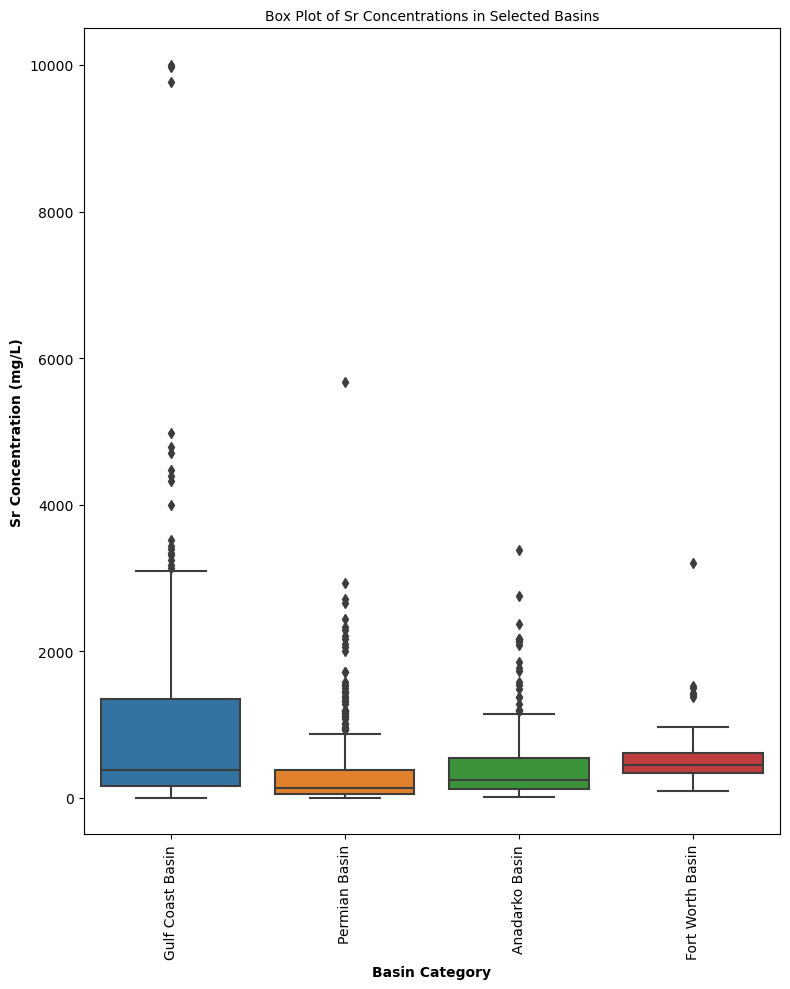

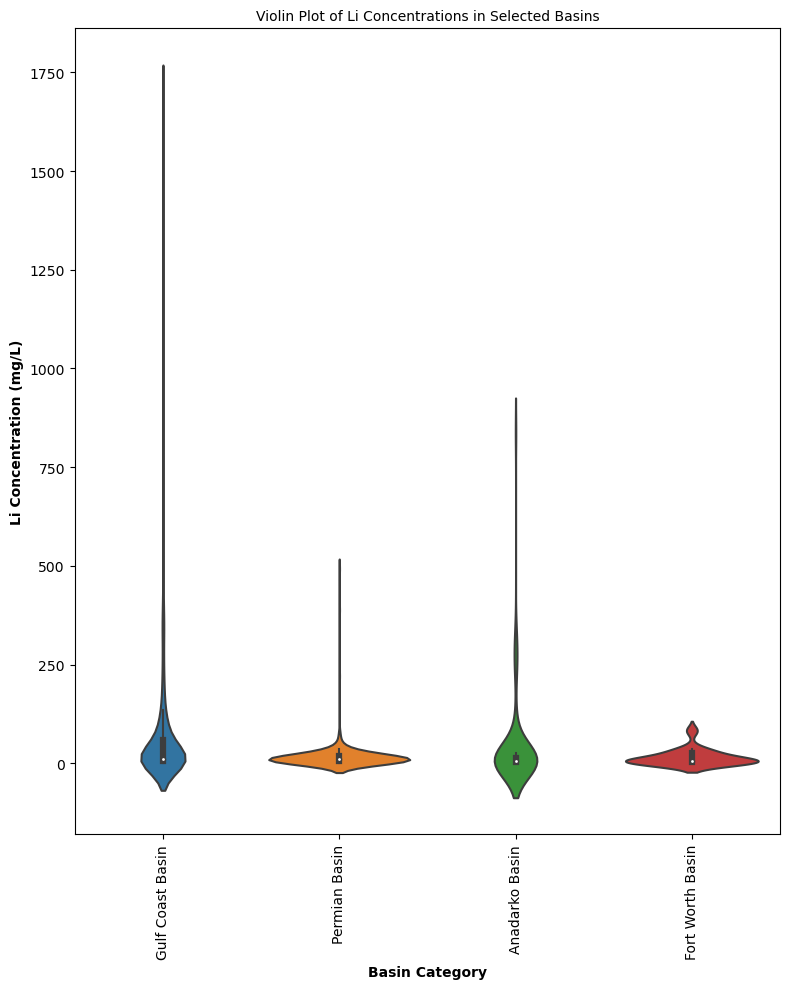

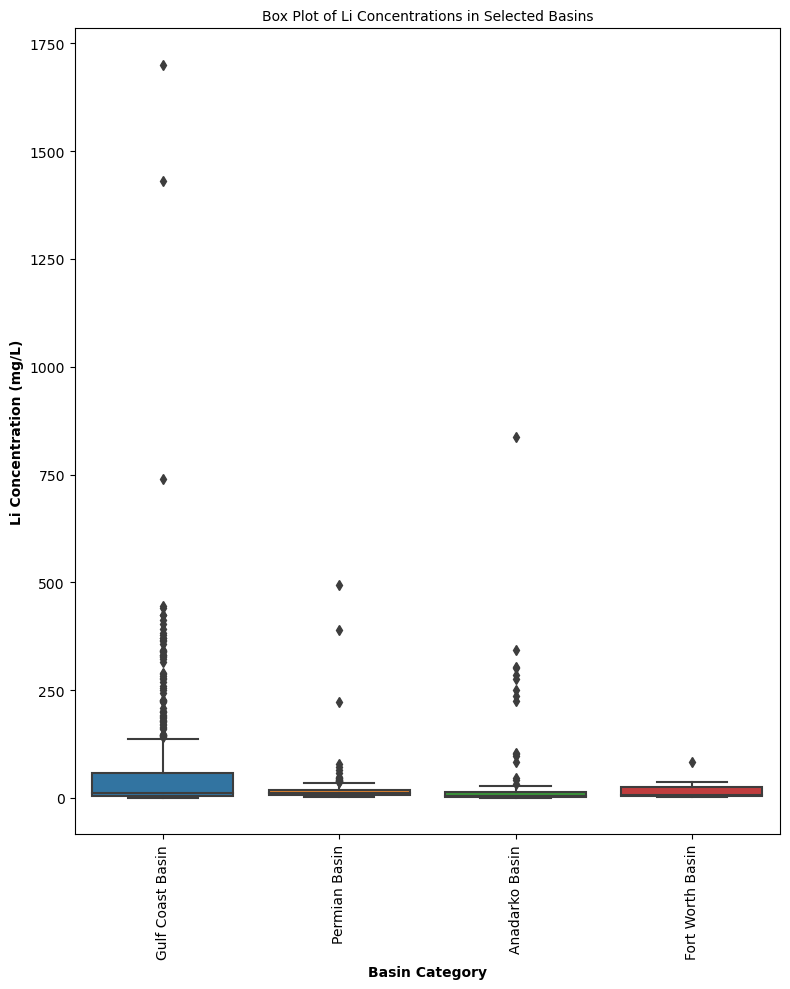

In [102]:
# Display basin categories and prompt the user to select
basin_categories = {
    1: "Anadarko Basin",
    2: "Appalachian Basin",
    3: "Gulf Coast Basin",
    4: "Oklahoma Platform Basins",
    5: "Fort Worth Basin",
    6: "Rocky Mountain Basins",
    7: "Illinois Basin",
    8: "Michigan Basin",
    9: "Permian Basin",
    10: "Williston Basin"
}

print("Please select basin categories by entering their numbers separated by commas:")
for number, category in basin_categories.items():
    print(f"{number}: {category}")

# Get user input and convert it to a list of selected basins
user_input = input("Enter the numbers: ")
selected_numbers = [int(num.strip()) for num in user_input.split(',')]
selected_basins = [basin_categories[num] for num in selected_numbers if num in basin_categories]

# Filter the dataframe to include only selected basins
df_selected_basins = df_filtered_recent_categorized_basin[df_filtered_recent_categorized_basin['BASIN_CATEGORY'].isin(selected_basins)]

# Determine figure size based on number of basins
fig_width = max(6, len(selected_basins) * 2)
fig_height = 10

# Function to create violin plots with dynamic sizing
def create_violin_plot(df, element, basin_col='BASIN_CATEGORY', fig_width=fig_width, fig_height=fig_height, save_path='../images/'):
    if element not in df.columns:
        print(f"Element '{element}' not found in the dataframe.")
        return
    plt.figure(figsize=(fig_width, fig_height))
    sns.violinplot(x=basin_col, y=element, data=df)
    plt.xticks(rotation=90)
    plt.title(f'Violin Plot of {element} Concentrations in Selected Basins')
    plt.xlabel('Basin Category')
    plt.ylabel(f'{element} Concentration (mg/L)')
    plt.tight_layout()
    violin_plot_filename = save_path + f'ViolinPlot_{element}.png'
    plt.savefig(violin_plot_filename)
    plt.show()
    plt.close()

# Function to create box plots with dynamic sizing
def create_box_plot(df, element, basin_col='BASIN_CATEGORY', fig_width=fig_width, fig_height=fig_height, save_path='../images/'):
    if element not in df.columns:
        print(f"Element '{element}' not found in the dataframe.")
        return
    plt.figure(figsize=(fig_width, fig_height))
    sns.boxplot(x=basin_col, y=element, data=df)
    plt.xticks(rotation=90)
    plt.title(f'Box Plot of {element} Concentrations in Selected Basins')
    plt.xlabel('Basin Category')
    plt.ylabel(f'{element} Concentration (mg/L)')
    plt.tight_layout()
    box_plot_filename = save_path + f'BoxPlot_{element}.png'
    plt.savefig(box_plot_filename)
    plt.show()
    plt.close()

# Elements to plot
elements_to_plot = ["Ca", "Mg", "HCO3", "Si", "FeTot", "Ba", "Sr", "Li"]

# Generate plots for each element in the selected basins
for element in elements_to_plot:
    if element in df_selected_basins.columns:
        create_violin_plot(df_selected_basins, element, save_path='../images/violin_plots/')
        create_box_plot(df_selected_basins, element, save_path='../images/box_plots/')
    else:
        print(f"Element '{element}' not found in the dataframe.")

### Linear Regressions

In [103]:
# Define a function for a linear regression plot

def linear_regression_plot(x, y, ylabel_, basin, element):
    # Perform linear regression
    slope, intercept, rvalue, pvalue, stderr = linregress(x, y)
    
    # Generate y values based on the regression line
    regression_line = slope * x + intercept
    eqn = 'y = ' + str(round(slope, 2)) + 'x + ' + str(round(intercept, 2))
    
    # Plot the data points
    plt.scatter(x, y)
    
    # Plot the regression line
    plt.plot(x, regression_line, 'r-')

    # Add labels
    plt.xlabel(f'{element} Concentration')
    plt.ylabel(ylabel_)
    plt.title(f'{basin}: {element} Concentration vs Depth\n{eqn} | r^2 = {round(rvalue**2, 3)}')
    
    # Save & display the plot
    print(f'R^2 = {rvalue**2}')
    print(f'R = {rvalue}')
    plt.savefig(f'../images/regression_plots/LinReg_{element}vs{ylabel_}_{basin.replace(" ", "")}.png')
    plt.show()


R^2 = 6.712441898628984e-06
R = -0.002590838068777936


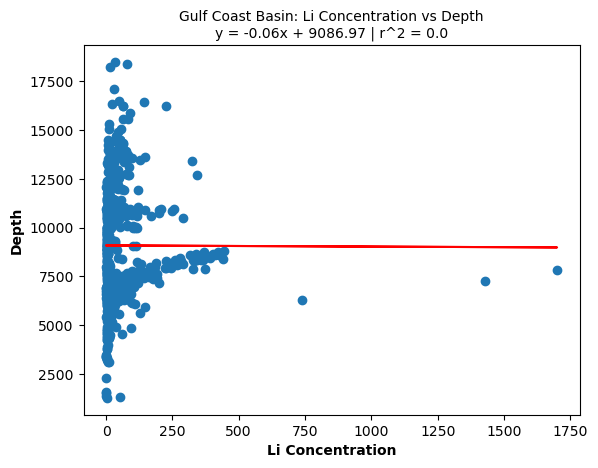

R^2 = 0.00029903594829508543
R = -0.01729265590634028


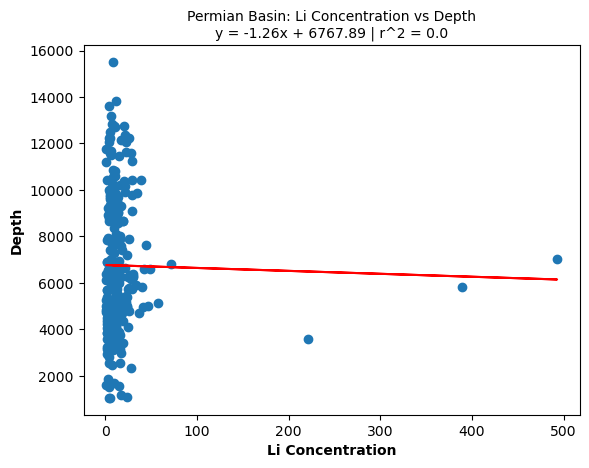

R^2 = 0.07263749256721615
R = 0.2695134367099647


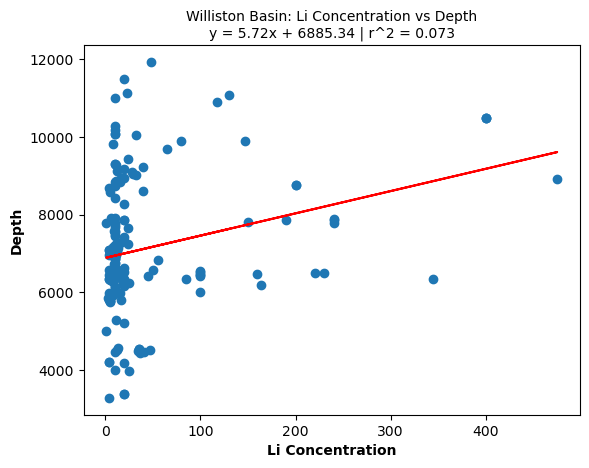

R^2 = 0.022598699922793095
R = 0.1503286397290719


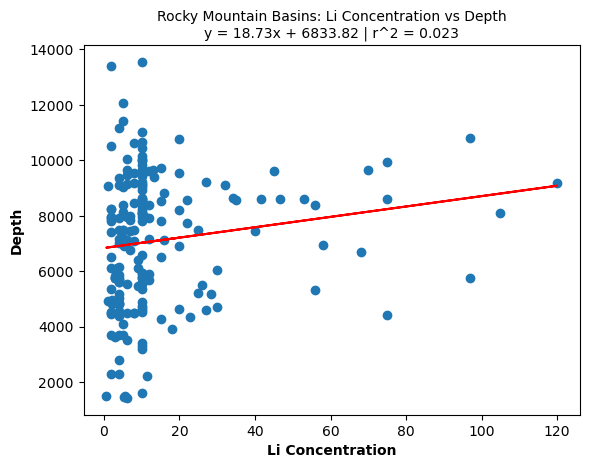

R^2 = 0.013352921271951534
R = 0.11555484097151246


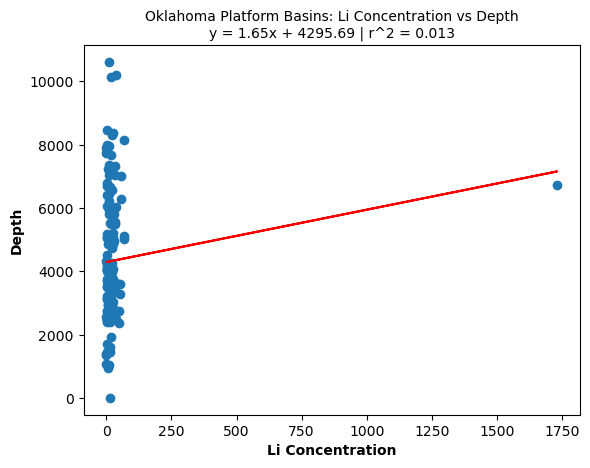

R^2 = 0.17944040090390362
R = -0.4236040614818319


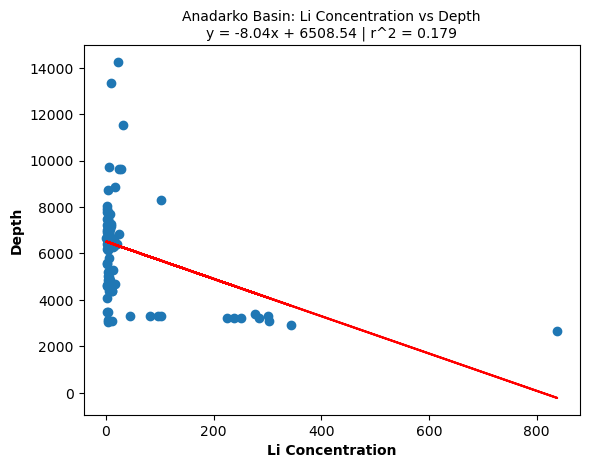

R^2 = 0.6517374550579009
R = 0.8073025796180147


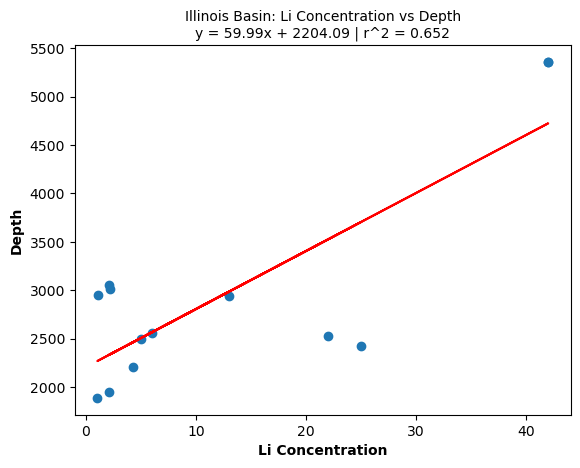

R^2 = 0.29433252729033726
R = 0.5425242181602009


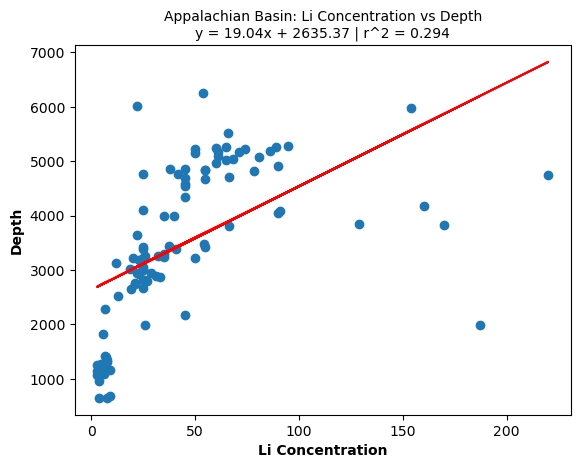

R^2 = 0.7427188008416605
R = 0.8618113487542738


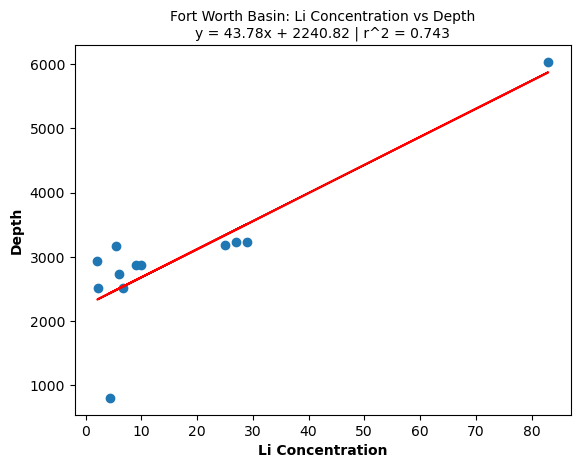

R^2 = 0.056510991929865625
R = 0.23772040705388678


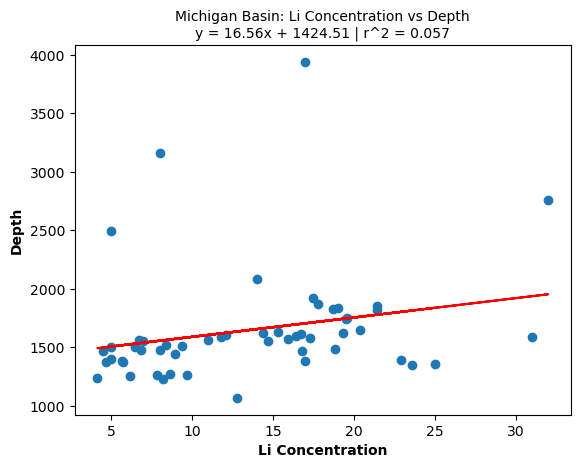

In [104]:
# Create linear regression plots
basins = df_filtered_recent_categorized_basin['BASIN_CATEGORY'].unique()
elements = ['Li']

for basin in basins:
    for element in elements:
        df_selected_basin_only = df_filtered_recent_categorized_basin[df_filtered_recent_categorized_basin['BASIN_CATEGORY'] == basin]
        df_selected_basin_only_element_depth = df_selected_basin_only.dropna(subset=[element, 'DEPTHUPPER'])
        linear_regression_plot(df_selected_basin_only_element_depth[element], 
                               df_selected_basin_only_element_depth['DEPTHUPPER'], 
                               'Depth', basin, element)


## VISUALIZATION

### Clustering

In [128]:
#Clustering Analysis-Lithium Concentration

# Clean DataFrame to remove NaN values
df_recent_samples_li = df_filtered_recent_categorized_basin.dropna(subset=['LATITUDE', 'LONGITUDE', 'Li'])

def assign_cluster(li_concentration):
    if li_concentration <= 20:
        return '<= 20 ppm'  
    elif li_concentration <= 40:
        return '21-40 ppm'
    elif li_concentration <= 60:
        return '41-60 ppm'
    elif li_concentration <= 80:
        return '61-80 ppm'
    else:
        return '> 80 ppm'

# Apply the function to create a new column 'Li_Cluster'
df_recent_samples_li['Li_Cluster'] = df_recent_samples_li['Li'].apply(assign_cluster)

# Drop rows where 'LATITUDE' or 'LONGITUDE' is NaN
gdf = gpd.GeoDataFrame(
    df_recent_samples_li.dropna(subset=['LATITUDE', 'LONGITUDE', 'Li']),
    geometry=gpd.points_from_xy(df_recent_samples_li['LONGITUDE'], df_recent_samples_li['LATITUDE'])
)

# Initialize the map centered around the mean latitude and longitude
m = folium.Map(location=[gdf['LATITUDE'].mean(), gdf['LONGITUDE'].mean()], zoom_start=5)

# Define a color scheme for the clusters
color_dict = {
    '<= 20 ppm': 'blue',
    '21-40 ppm': 'green',
    '41-60 ppm': 'yellow',
    '61-80 ppm': 'orange',
    '> 80 ppm': 'red'
}

''' ------------------------------------ '''
''' THIS SECTION ADDS THE BASIN OUTLINES '''

# File path
shapes_path = f"../data/SedimentaryBasins_US_EIA.shp"

# Read the data
shapes = gpd.read_file(shapes_path)

# Set layer style
def style_function(feature):
    return {
        'fillColor': 'gray',
        'color': 'gray',
        'weight': 1,
        'fillOpacity': 0.2,
    }

# Convert points to GeoJSON
shapes_gjson = folium.features.GeoJson(shapes, name="US Sedimentary Basins", control=True, style_function=style_function)

# Check the GeoJSON features
shapes_gjson.data.get('features')

# Add points to the map instance
shapes_gjson.add_to(m)

# Create a layer control object and add it to map instance
folium.LayerControl().add_to(m)

''' ------------------------------------ '''

# Add points to the map
for _, row in gdf.iterrows():
    cluster_label = row['Li_Cluster']
    folium.CircleMarker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        radius=5,
        color=color_dict[cluster_label],  # This should now work without a KeyError
        fill=True,
        fill_color=color_dict[cluster_label],
        fill_opacity=0.7
    ).add_to(m)

# Define the HTML for the legend
legend_html = """
<div id="legend" style="position: fixed; bottom: 10px; left: 10px; padding: 10px; background-color: white; 
    border: 1px solid #bbb; z-index: 9999; font-size: 14px; box-shadow: 0 0 15px rgba(0, 0, 0, 0.2);
    line-height: 18px;">
    <b>Legend</b><br>
    <= 20 ppm&nbsp;<i style="background: blue; width: 18px; height: 18px; display: inline-block;"></i><br>
    21-40 ppm&nbsp;<i style="background: green; width: 18px; height: 18px; display: inline-block;"></i><br>
    41-60 ppm&nbsp;<i style="background: yellow; width: 18px; height: 18px; display: inline-block;"></i><br>
    61-80 ppm&nbsp;<i style="background: orange; width: 18px; height: 18px; display: inline-block;"></i><br>
    > 80 ppm&nbsp;<i style="background: red; width: 18px; height: 18px; display: inline-block;"></i>
</div>
"""

# Create an Element object, and add the HTML code for the legend
legend_element = Element(legend_html)

# Add the legend element to the map
m.get_root().html.add_child(legend_element)

# Save the map to an HTML file
m.save('../images/geo_plots/Li_cluster_map.html')


In [129]:
#Lithium Gradient color code for concentrations above 80 mg/L

# Filter the dataframe for lithium concentrations >= 80
df_high_li = df_recent_samples_li[df_recent_samples_li['Li'] >= 80]

# Create a GeoDataFrame for the filtered data
gdf_high_li = gpd.GeoDataFrame(
    df_high_li,
    geometry=gpd.points_from_xy(df_high_li['LONGITUDE'], df_high_li['LATITUDE'])
)

# Initialize the map centered around the mean latitude and longitude of the high concentration data
m = folium.Map(location=[gdf_high_li['LATITUDE'].mean(), gdf_high_li['LONGITUDE'].mean()], zoom_start=5)

# Create a custom color scale from medium red to dark red
max_li = df_high_li['Li'].max()
min_li = 80  # Since we are only considering values >= 80
color_scale = cm.LinearColormap(
    colors=['#ff9999', '#8b0000'],  # medium red to dark red
    index=[min_li, max_li],
    vmin=min_li,
    vmax=max_li
)

''' ------------------------------------ '''
''' THIS SECTION ADDS THE BASIN OUTLINES '''

# File path
shapes_path = f"../data/SedimentaryBasins_US_EIA.shp"

# Read the data
shapes = gpd.read_file(shapes_path)

# Set layer style
def style_function(feature):
    return {
        'fillColor': 'gray',
        'color': 'gray',
        'weight': 1,
        'fillOpacity': 0.2,
    }

# Convert points to GeoJSON
shapes_gjson = folium.features.GeoJson(shapes, name="US Sedimentary Basins", control=True, style_function=style_function)

# Check the GeoJSON features
shapes_gjson.data.get('features')

# Add points to the map instance
shapes_gjson.add_to(m)

# Create a layer control object and add it to map instance
folium.LayerControl().add_to(m)

''' ------------------------------------ '''

# Add points to the map
for _, row in gdf_high_li.iterrows():
    color = color_scale(row['Li'])  
    
    folium.CircleMarker(
        location=[row['LATITUDE'], row['LONGITUDE']],
        radius=5,
        color=color,  
        weight=0,  #this removes the edge
        fill=True,
        fill_color=color,  # This sets the fill color
        fill_opacity=0.7  # This sets the fill opacity
    ).add_to(m)

# Add the color scale to the map
m.add_child(color_scale)

# Save the map to an HTML file
m.save('../images/geo_plots/Li_high_concentration_map.html')


### Functions Used in Piper Plot Generation

In [17]:
def generate_single_basin_df_with_wqchartpy_required_format(df, basin):
    
    # Filter input dataframe to only show the basin provided; if 'all' is provided, skip
    mask = df['BASIN_CATEGORY'] == basin
    df_basin = df[mask]

    # If the basin mask returns an empty dataframe, kill the code from continuing to run and display error message
    if df_basin.all().all():
        print(f'"{basin}" does not exist in the "BASIN_CATEGORY" column in the provided dataframe. Check your spelling/case, or provide a different basin name.')
        print(' ')
        basin_avail = df['BASIN_CATEGORY'].unique()
        print(f'The available options in the provided dataframe are:')
        print(f'{basin_avail}')
        return

    '''
    # The below list of column names is just to document the required column names and column order to feed into wqchartpy - variable is not used; just here for reference
    columns_for_wqchartpy = ['Sample', 'Label', 'Marker', 'Size', 'Color', 'Alpha', 'Ca', 'Mg', 'Na', 'K', 'HCO3', 'CO3', 'Cl', 'SO4']
    # The below list of column names is just to document the column names from the USGS data that will be used to feed into the wqchartpy formatted df - variable is not used; just here for reference
    columns_from_usgs = ['IDUSGS', 'Ca', 'Mg', 'Na', 'K', 'HCO3', 'CO3', 'Cl', 'SO4']
    '''

    # Create new dataframe to match format required by wqchartpy for the contour piper plot
    df_wqchartpyformat = pd.DataFrame()

    df_wqchartpyformat = pd.DataFrame()
    df_wqchartpyformat['Sample'] = df_basin['IDUSGS'].map(str)
    df_wqchartpyformat['Label'] = 'sample'
    df_wqchartpyformat['Marker'] = 'o'
    df_wqchartpyformat['Color'] = '#FFFF00'
    df_wqchartpyformat['Size'] = 10
    df_wqchartpyformat['Alpha'] = 0.5

    elements = ['Ca', 'Mg', 'Na', 'K', 'HCO3', 'CO3', 'Cl', 'SO4']
    for element in elements:
        df_wqchartpyformat[element] = df_basin[element]

    # Reset the index
    df_wqchartpyformat.reset_index(inplace=True, drop=True)

    print(f'A dataframe called df_wqchartpyformat has been created that contains {len(df_wqchartpyformat)} samples from the {basin}.')
    print('---')

    return df_wqchartpyformat


In [1]:
def generate_single_basin_piper_plot(df, basin, piper_type, image_name, image_type):
    
    df_wqchartpyformat = generate_single_basin_df_with_wqchartpy_required_format(df, basin)
    
    print('Patience please. The piper plot code may take a while to run.')
    print('---')

    if piper_type == 'triangle':
        triangle_piper_mod(df_wqchartpyformat,unit='mg/L',figname=image_name,figformat='png')
    elif piper_type == 'contour':
        contour_piper_mod(df_wqchartpyformat,unit='mg/L',figname=image_name,figformat='png')
    elif piper_type == 'color':
        color_piper.plot(df_wqchartpyformat,unit='mg/L',figname=image_name,figformat='png')
    else:
        print(f"Piper plot type provided is not a valid option. Please input 'triangle', 'contour', or 'color'.")
        return

    plt.text(0.05, 0.85, f'{basin}', color='black', fontsize=12, ha='left', transform=plt.gcf().transFigure)
    plt.text(0.05, 0.83, f'# Samples: {len(df_wqchartpyformat):,}', color='black', fontsize=10, ha='left', transform=plt.gcf().transFigure)
    # Add labels to contour lines
    plt.clabel(contours, inline=True, fontsize=8)
    
    plt.savefig(f'{image_name}.png', format='png', bbox_inches='tight', dpi=300)
    plt.show()

    image_file_name = f'{image_name}.png'
    move_image_file_to_images_folder(image_file_name, image_type)
    

### Generate Contour Piper Plots: All Samples From Each Well

A dataframe called df_wqchartpyformat has been created that contains 1653 samples from the Appalachian Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



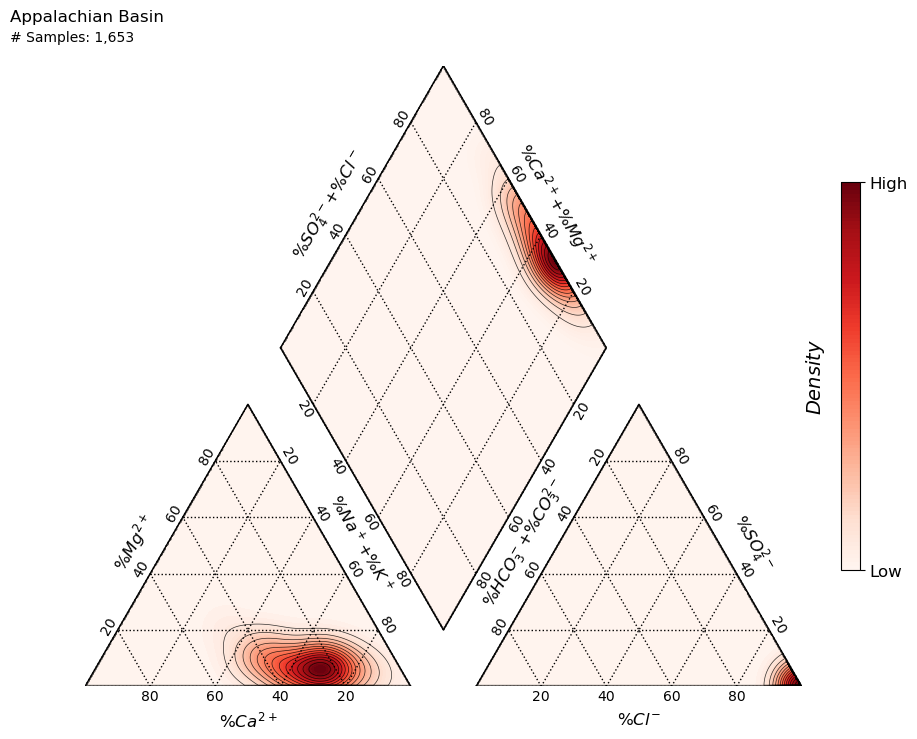

File 'AppalachianBasin_AllWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 6447 samples from the Permian Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



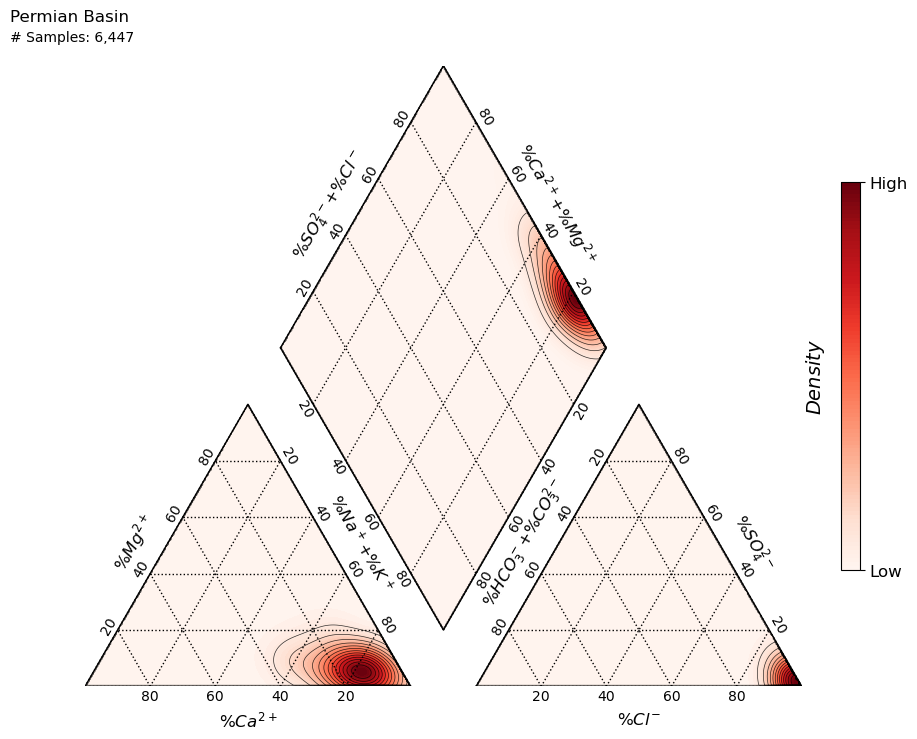

File 'PermianBasin_AllWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 11946 samples from the Gulf Coast Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



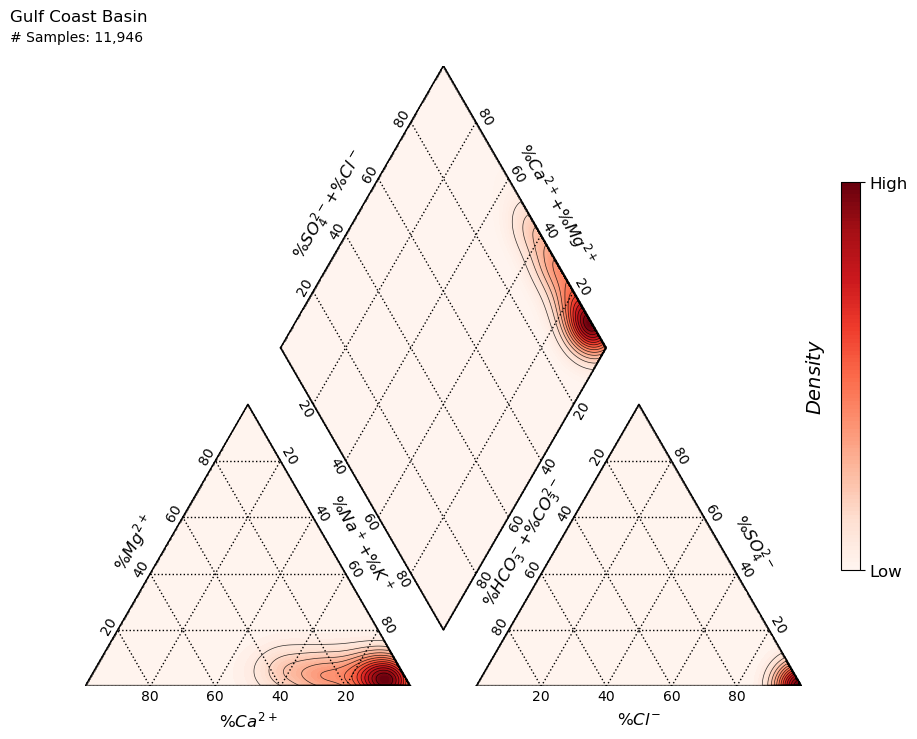

File 'GulfCoastBasin_AllWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 9204 samples from the Williston Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



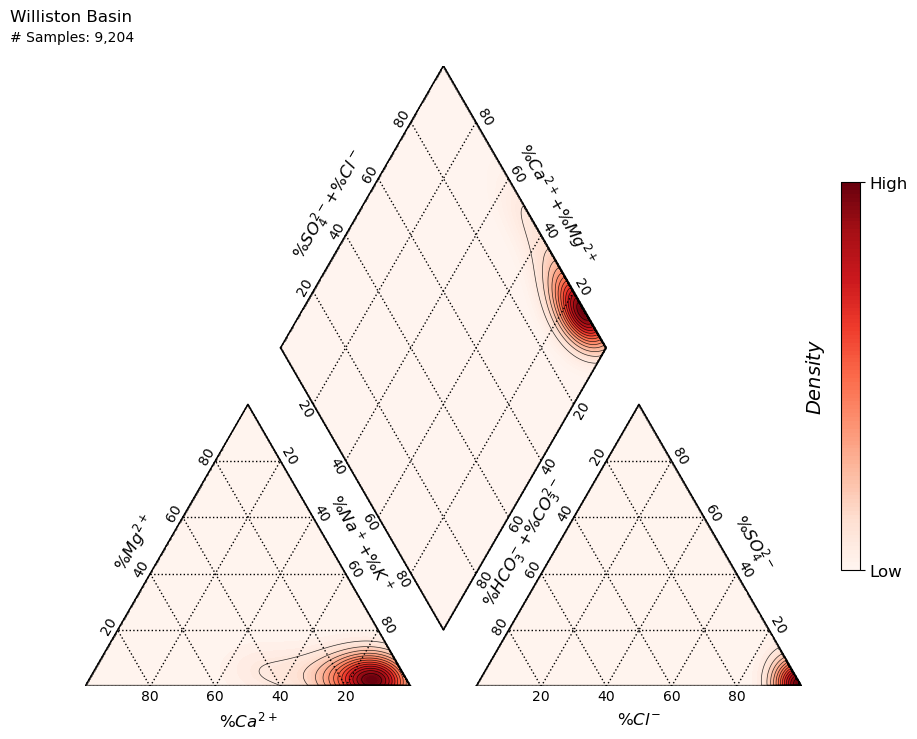

File 'WillistonBasin_AllWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 709 samples from the Michigan Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



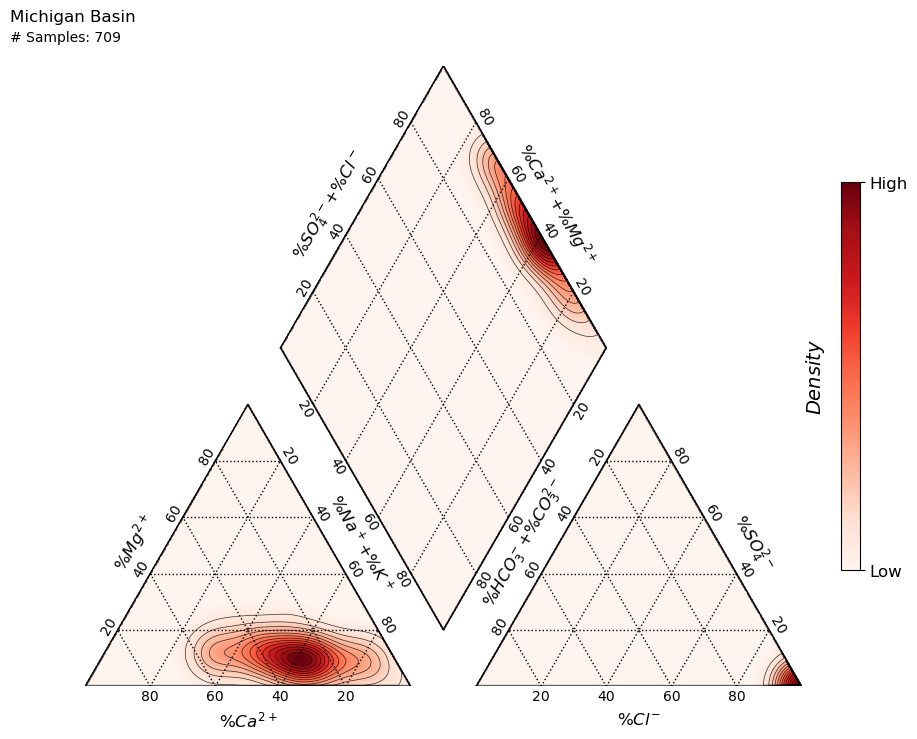

File 'MichiganBasin_AllWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 9154 samples from the Oklahoma Platform Basins.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



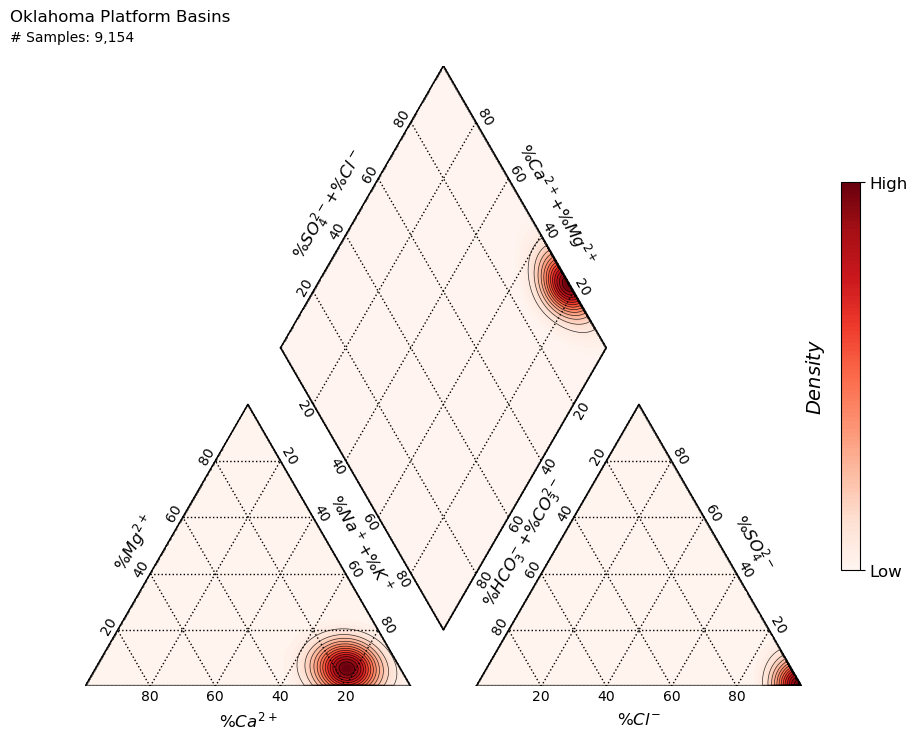

File 'OklahomaPlatformBasins_AllWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 2491 samples from the Rocky Mountain Basins.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



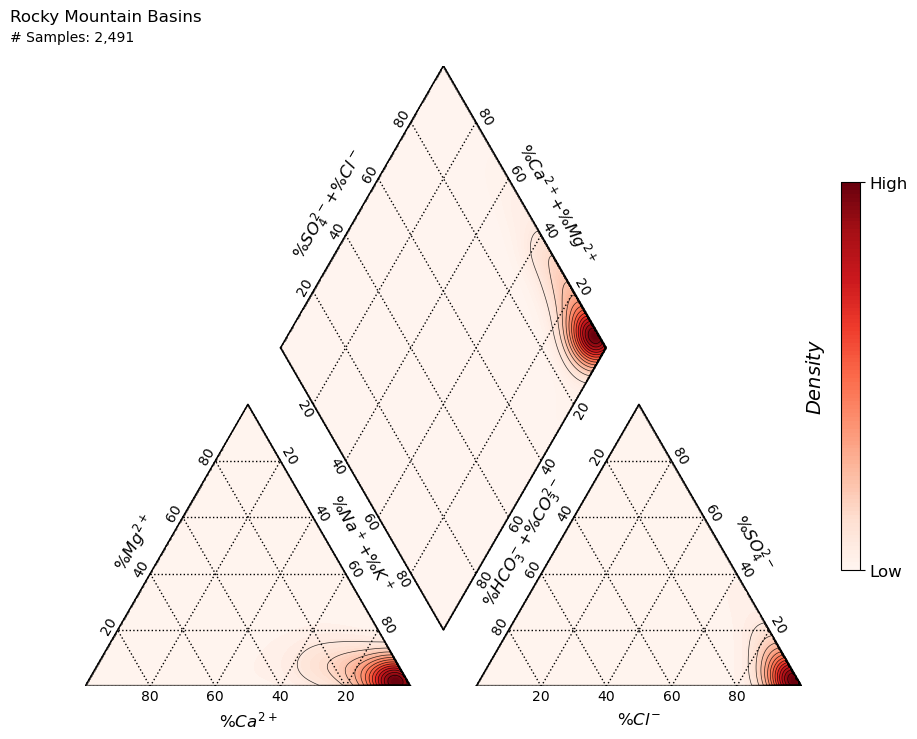

File 'RockyMountainBasins_AllWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 1779 samples from the Illinois Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



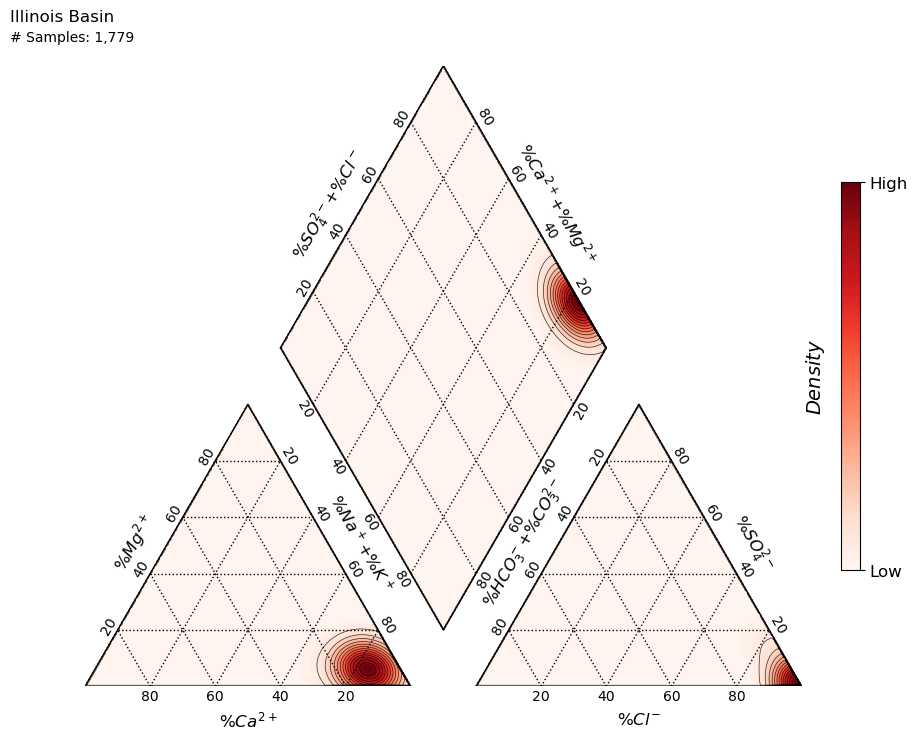

File 'IllinoisBasin_AllWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 2882 samples from the Anadarko Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



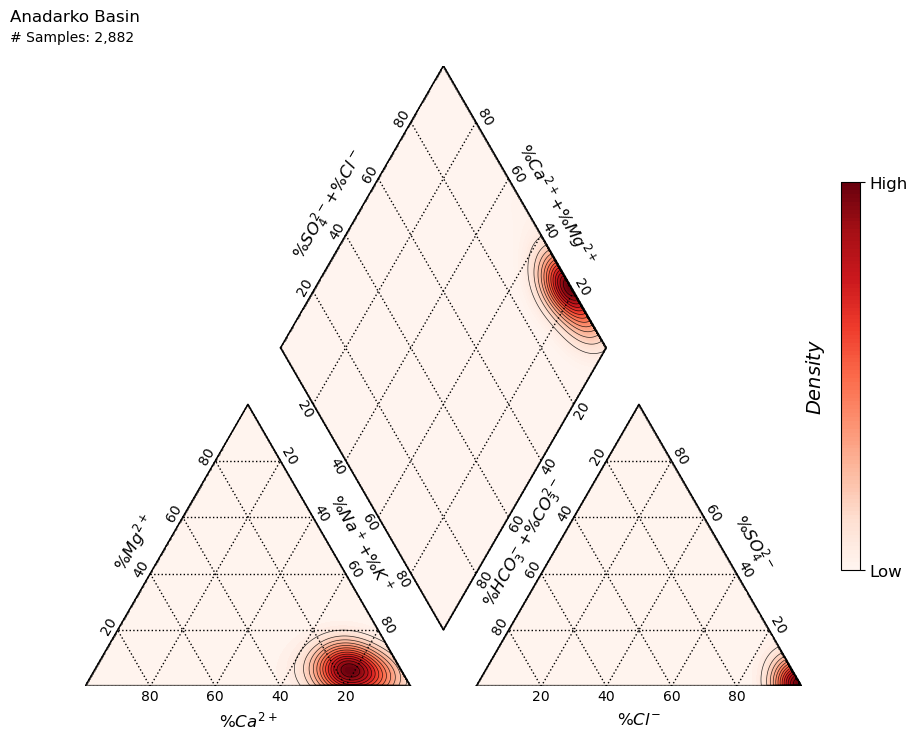

File 'AnadarkoBasin_AllWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 303 samples from the Fort Worth Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



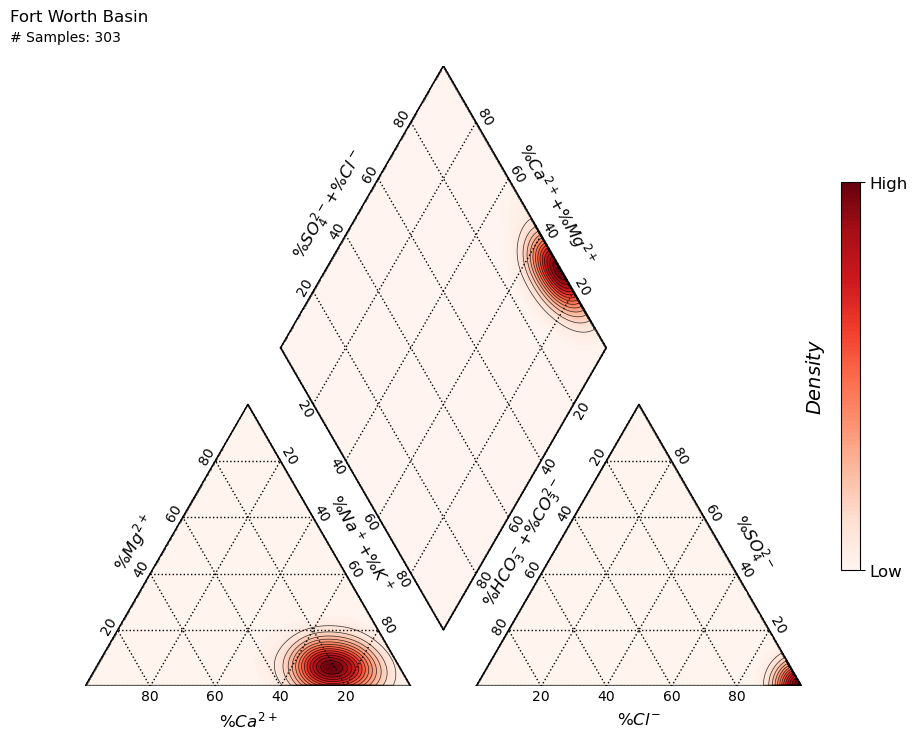

File 'FortWorthBasin_AllWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---


In [19]:
# Generate all basin category contour piper plots that include all samples from each well
basins = df_filtered_categorized_basin['BASIN_CATEGORY'].unique()

for basin in basins:
    basin = basin
    piper_type = 'contour'
    image_name = f'{basin.replace(" ", "")}_AllWellSamples_Piper(Contour)'
    image_type = 'piper'
    generate_single_basin_piper_plot(df_filtered_categorized_basin, basin, piper_type, image_name, image_type)
    

### Generate Colorful Piper Plots: All Samples From Each Well

A dataframe called df_wqchartpyformat has been created that contains 1653 samples from the Appalachian Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



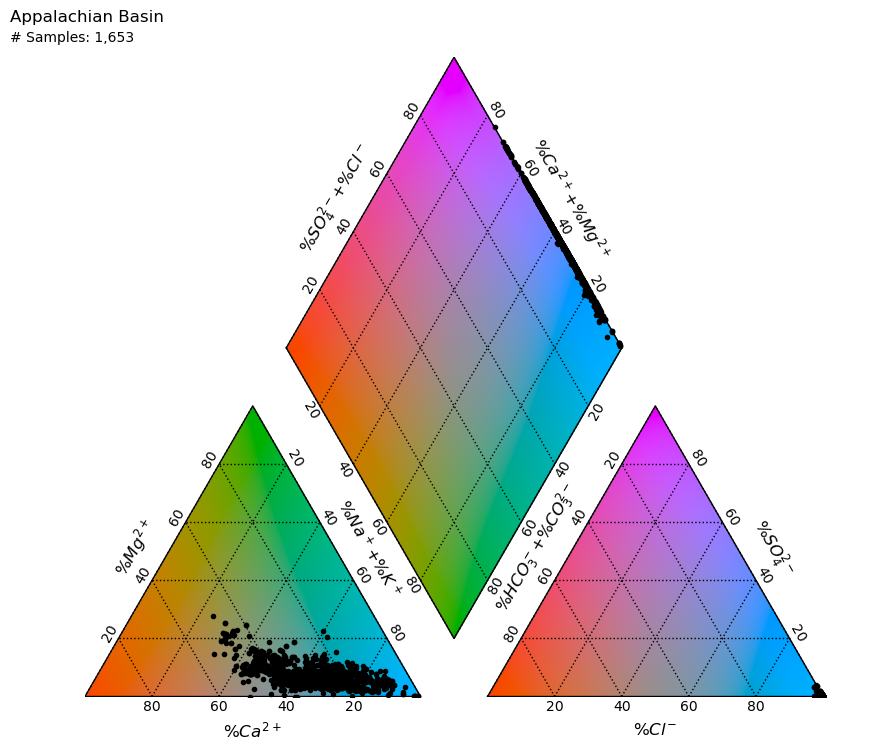

File 'AppalachianBasin_AllWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 6447 samples from the Permian Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



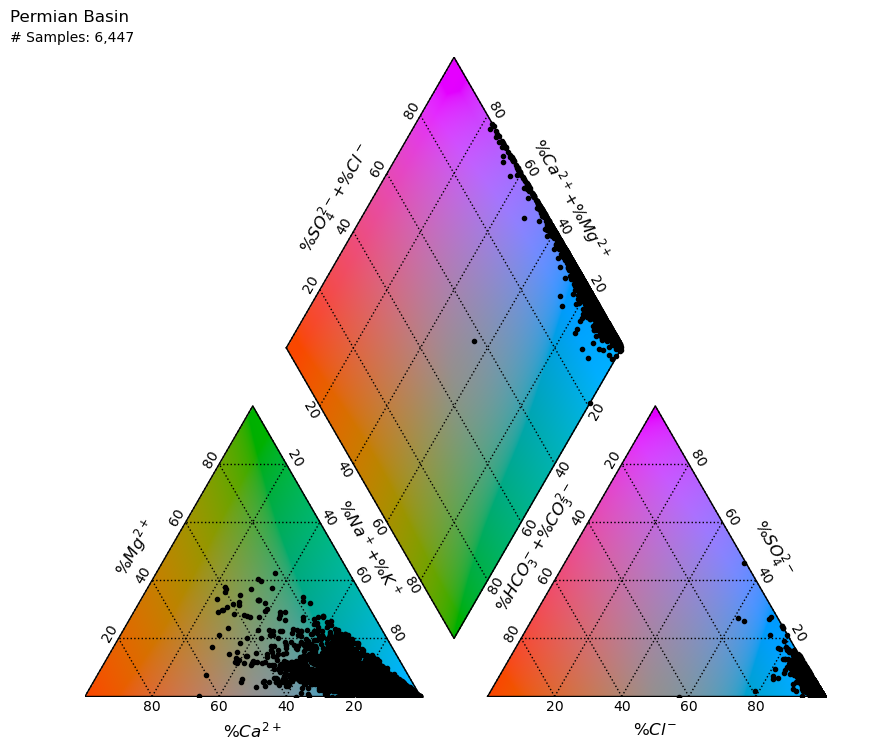

File 'PermianBasin_AllWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 11946 samples from the Gulf Coast Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



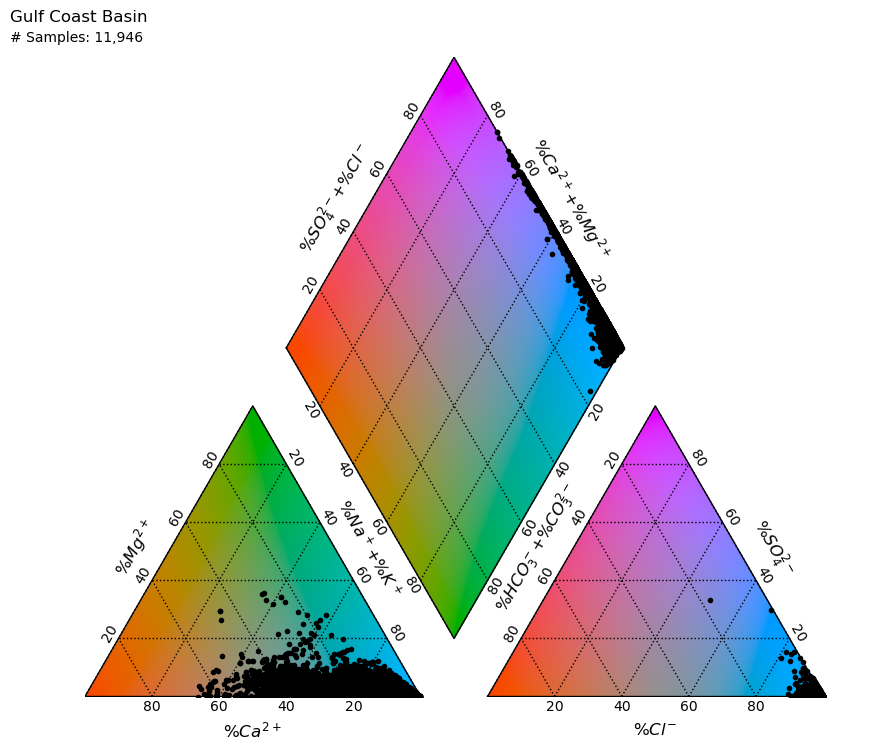

File 'GulfCoastBasin_AllWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 9204 samples from the Williston Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



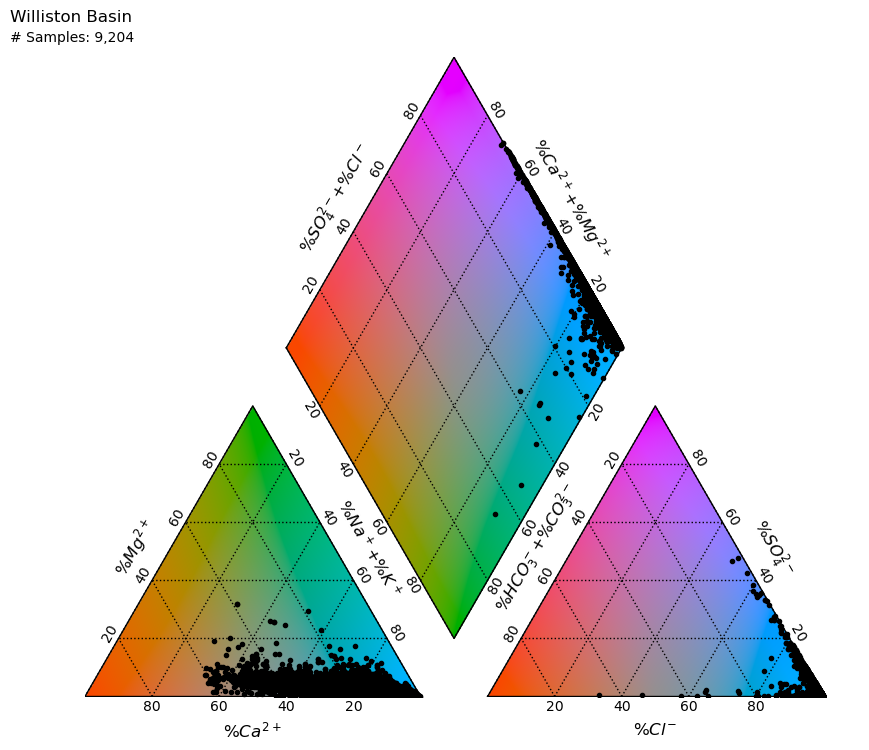

File 'WillistonBasin_AllWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 709 samples from the Michigan Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



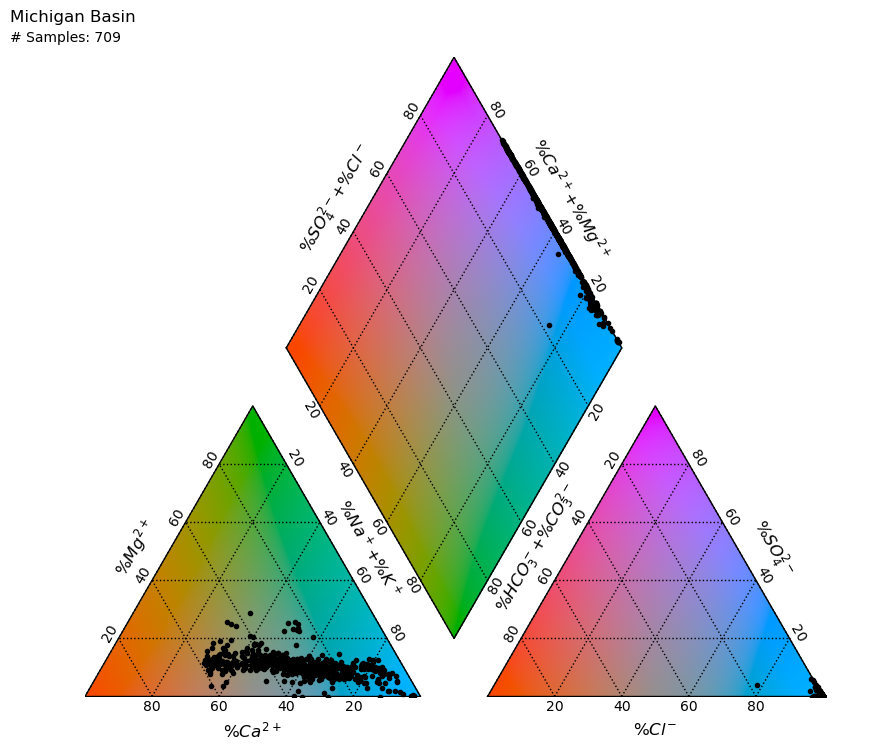

File 'MichiganBasin_AllWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 9154 samples from the Oklahoma Platform Basins.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



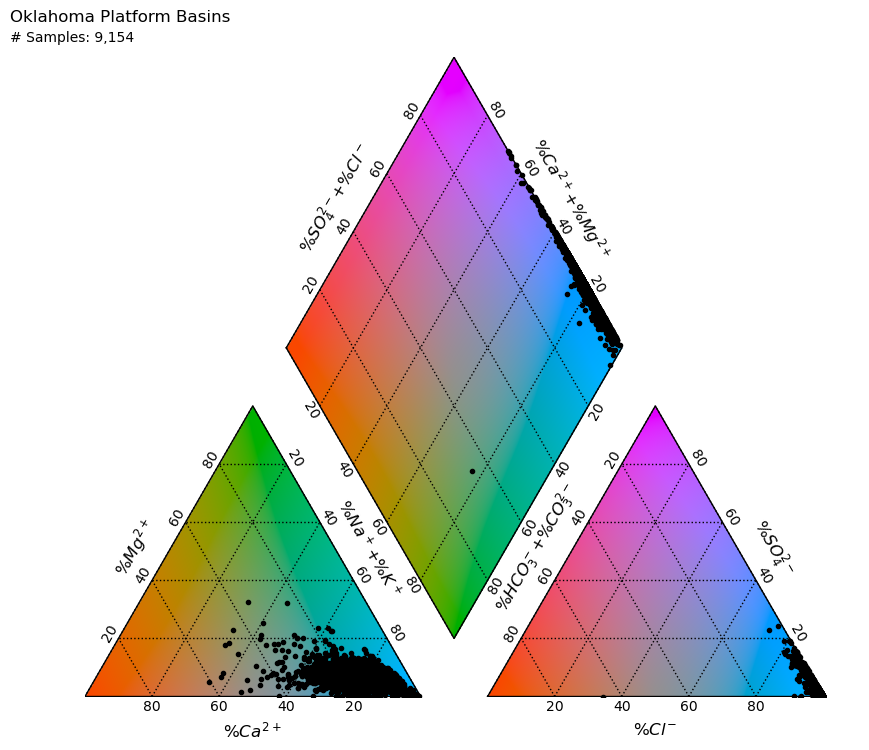

File 'OklahomaPlatformBasins_AllWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 2491 samples from the Rocky Mountain Basins.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



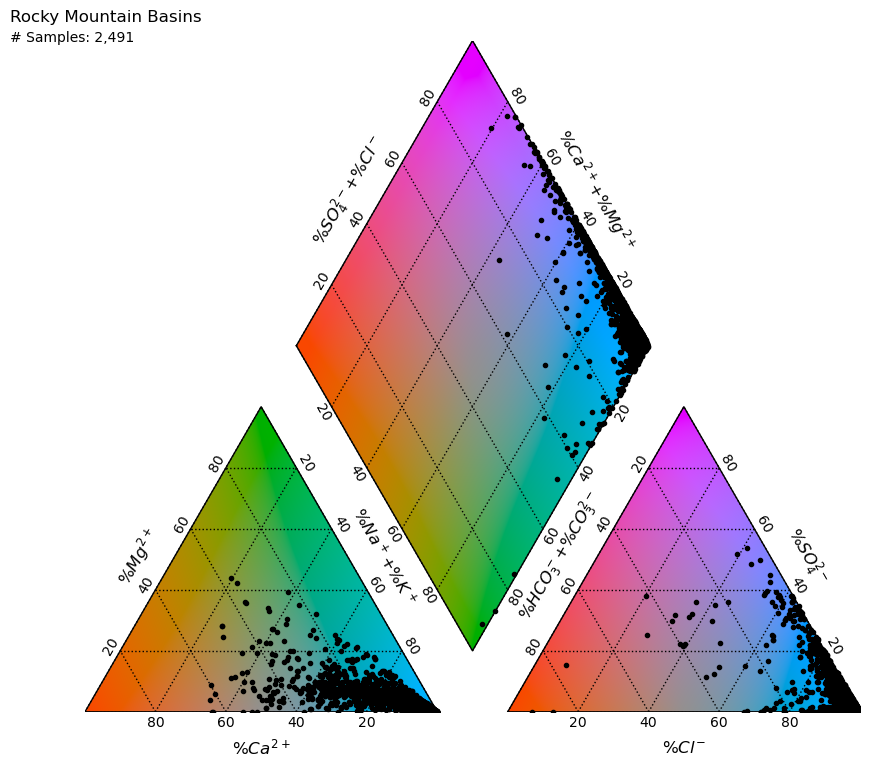

File 'RockyMountainBasins_AllWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 1779 samples from the Illinois Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



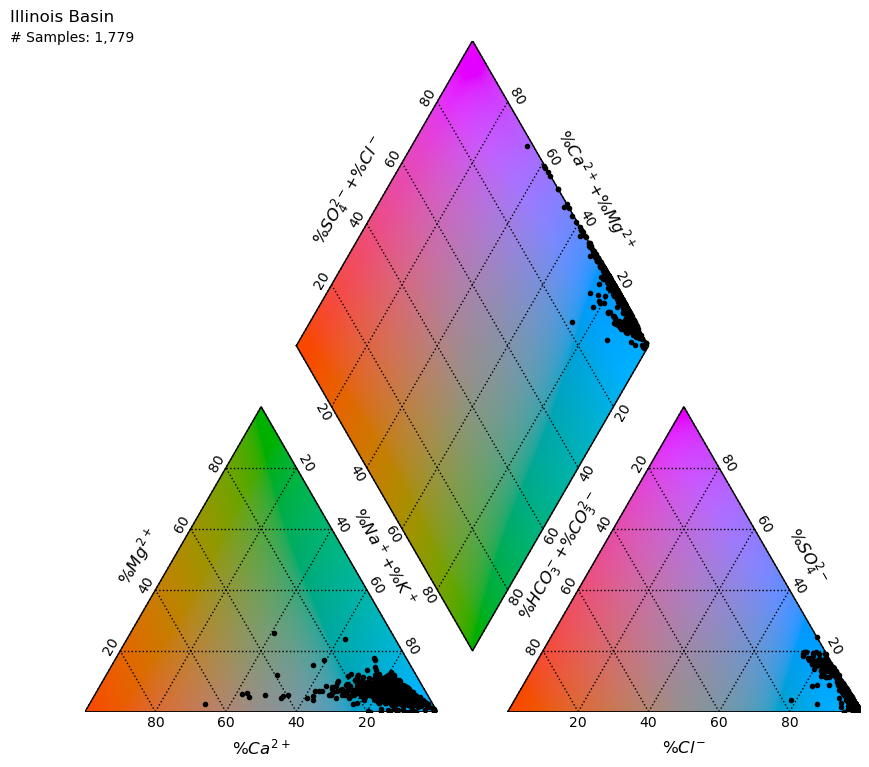

File 'IllinoisBasin_AllWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 2882 samples from the Anadarko Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



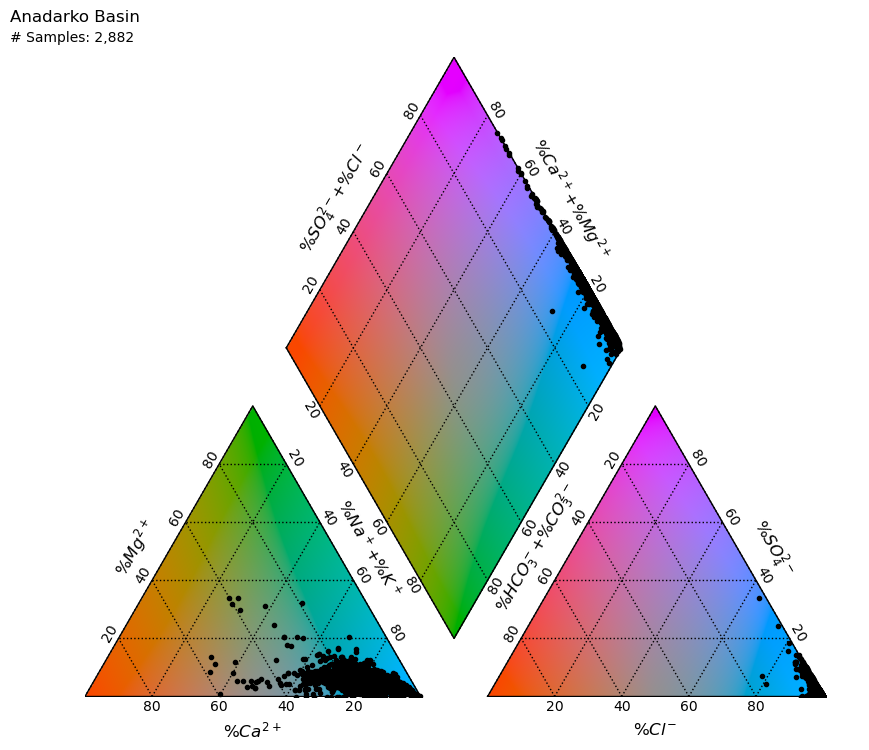

File 'AnadarkoBasin_AllWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 303 samples from the Fort Worth Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



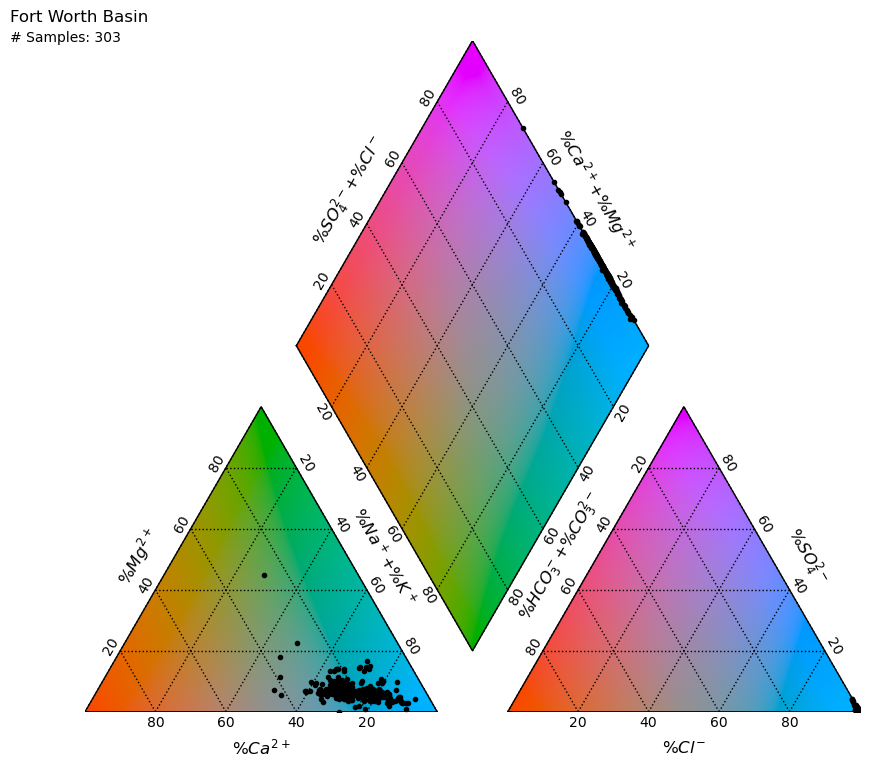

File 'FortWorthBasin_AllWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---


In [22]:
# Generate all basin category color piper plots that include all samples from each well
basins = df_filtered_categorized_basin['BASIN_CATEGORY'].unique()

for basin in basins:
    basin = basin
    piper_type = 'color'
    image_name = f'{basin.replace(" ", "")}_AllWellSamples_Piper(Color)'
    image_type = 'piper'
    generate_single_basin_piper_plot(df_filtered_categorized_basin, basin, piper_type, image_name, image_type)
    

### Generate Triangle Piper Plots: All Samples From Each Well

A dataframe called df_wqchartpyformat has been created that contains 1653 samples from the Appalachian Basin.
---
Patience please. The piper plot code may take a while to run.
---


Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



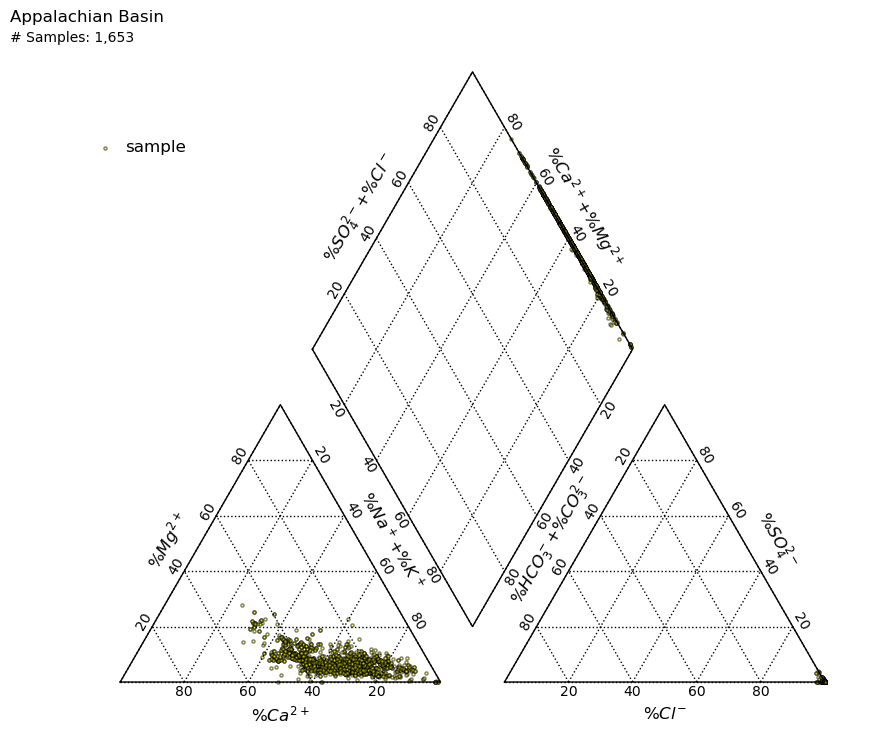

File 'AppalachianBasin_AllWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 6447 samples from the Permian Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



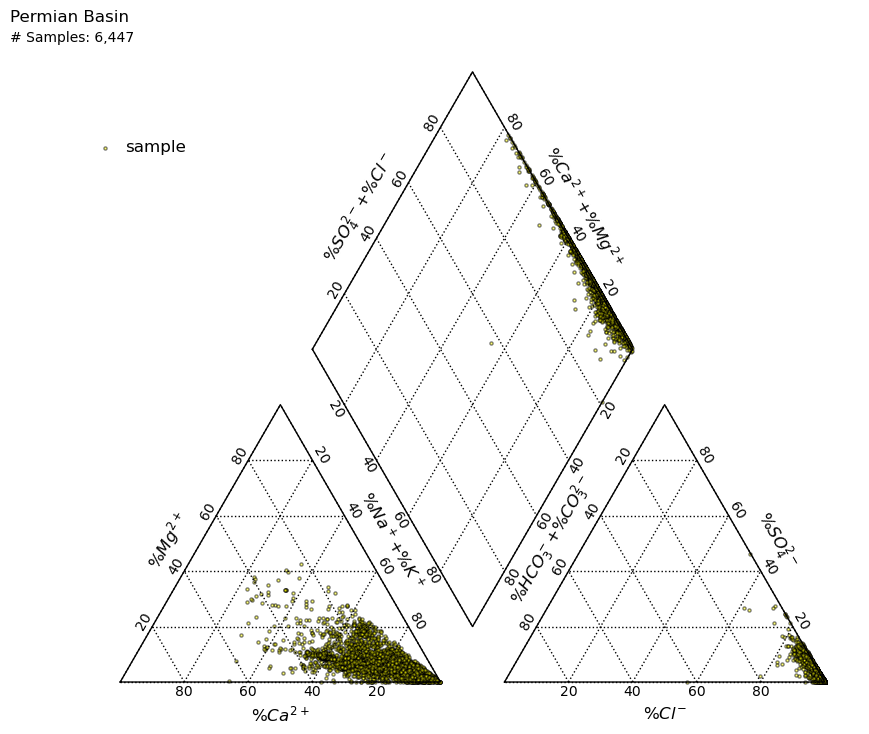

File 'PermianBasin_AllWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 11946 samples from the Gulf Coast Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



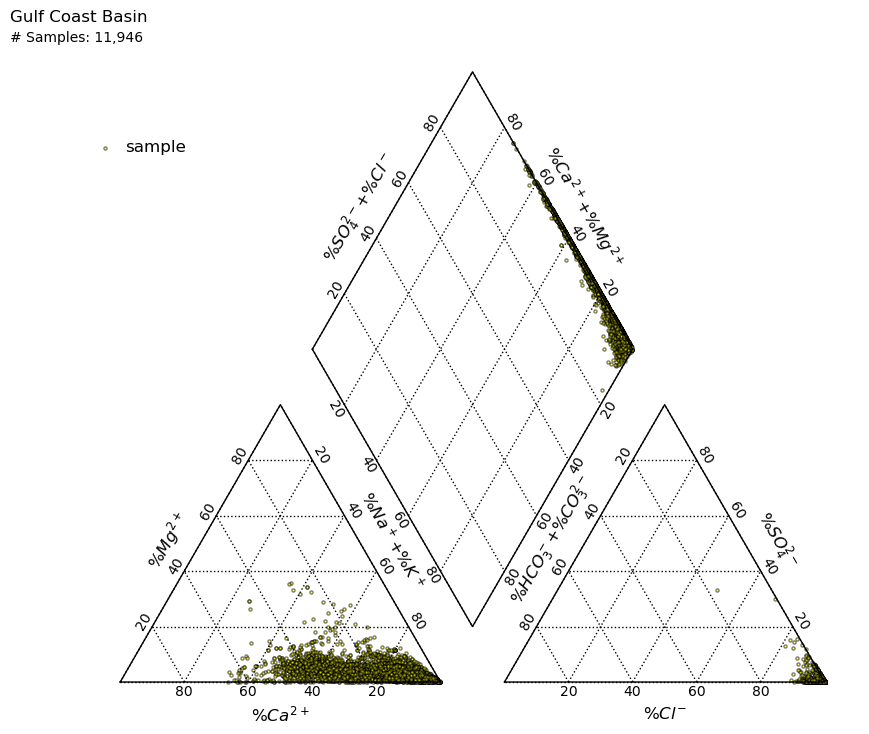

File 'GulfCoastBasin_AllWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 9204 samples from the Williston Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



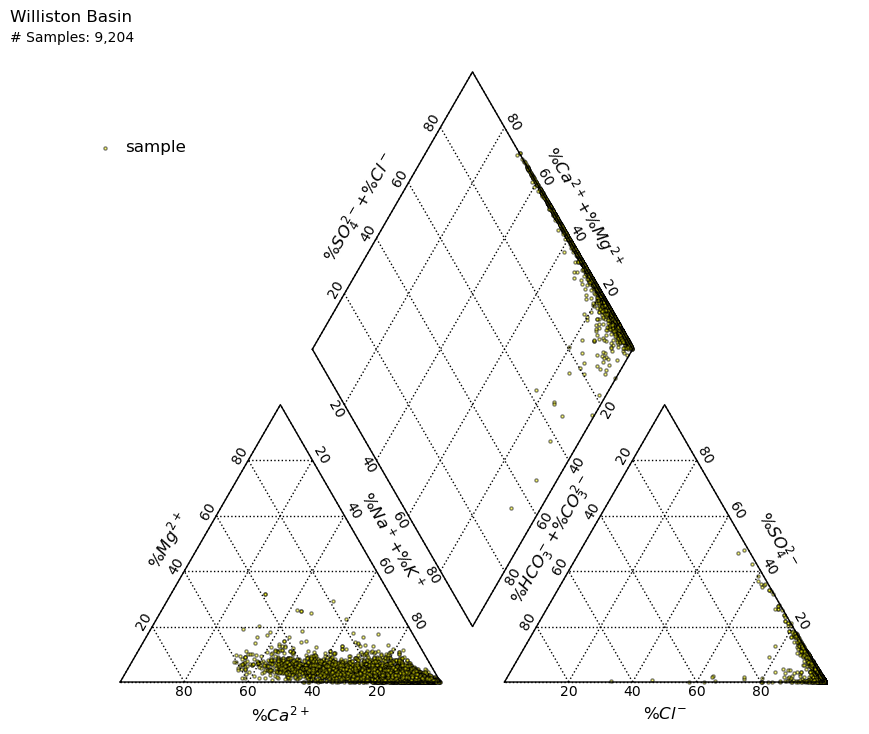

File 'WillistonBasin_AllWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 709 samples from the Michigan Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



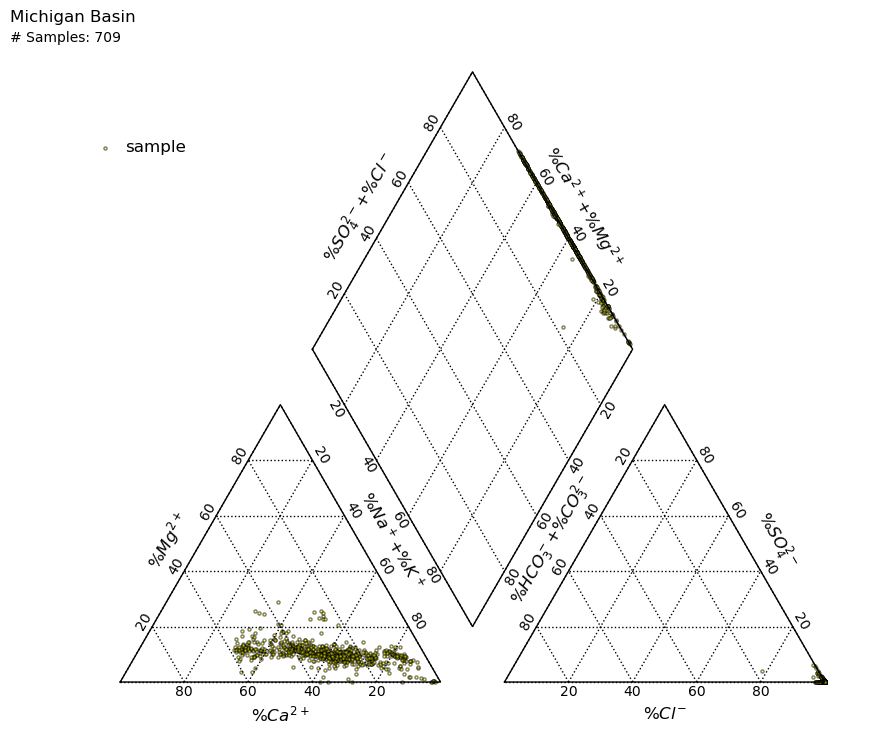

File 'MichiganBasin_AllWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 9154 samples from the Oklahoma Platform Basins.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



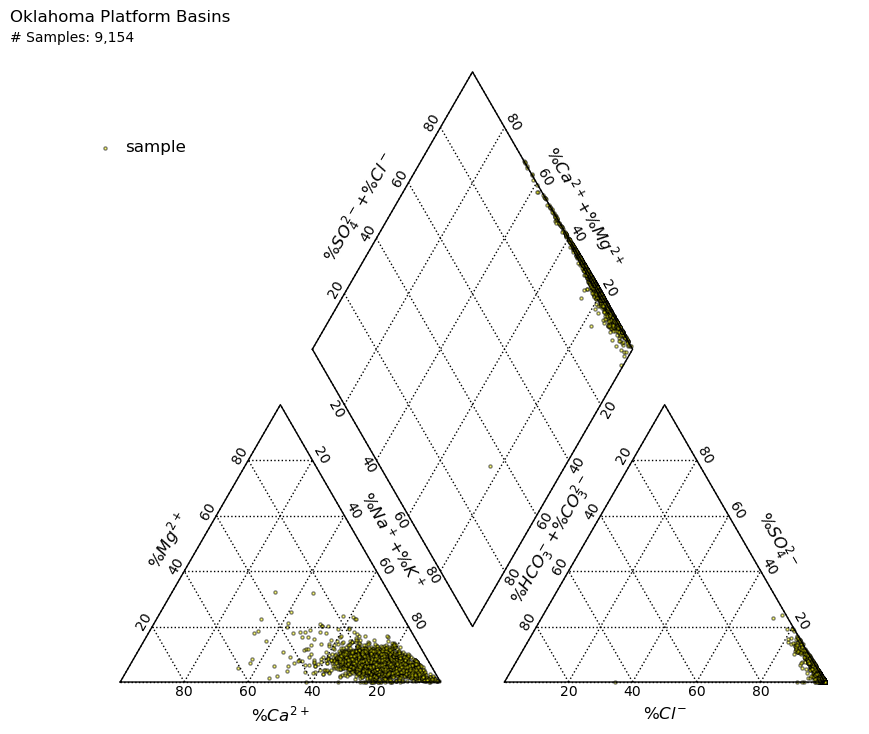

File 'OklahomaPlatformBasins_AllWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 2491 samples from the Rocky Mountain Basins.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



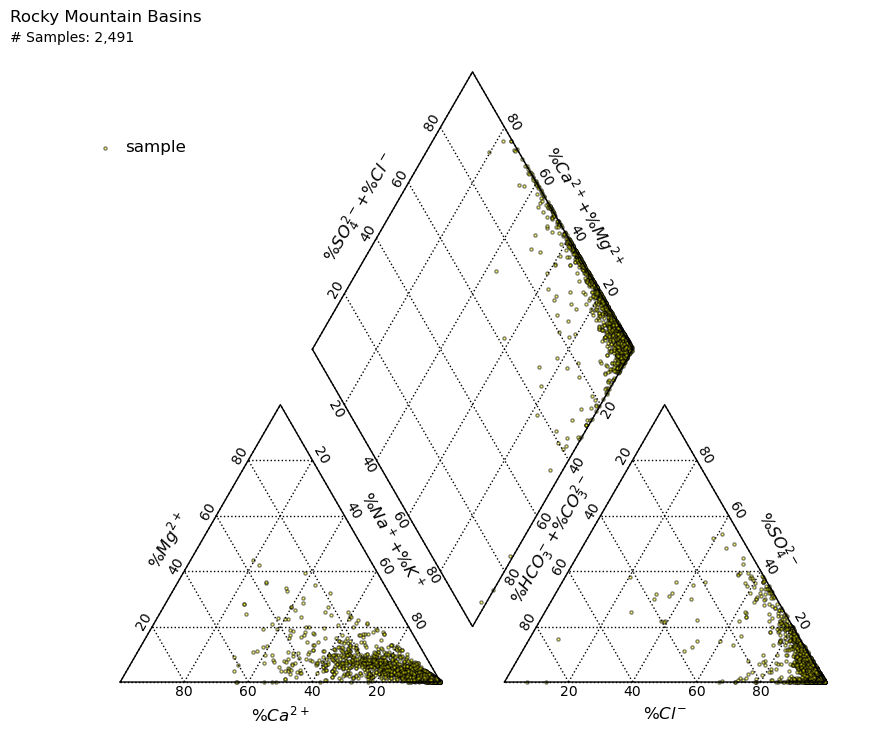

File 'RockyMountainBasins_AllWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 1779 samples from the Illinois Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



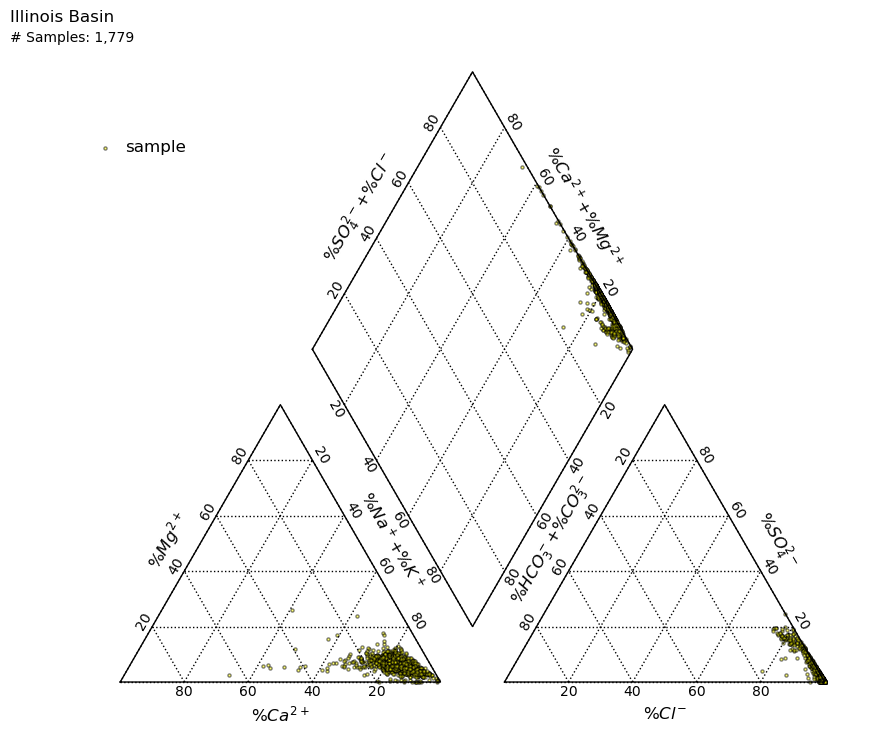

File 'IllinoisBasin_AllWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 2882 samples from the Anadarko Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



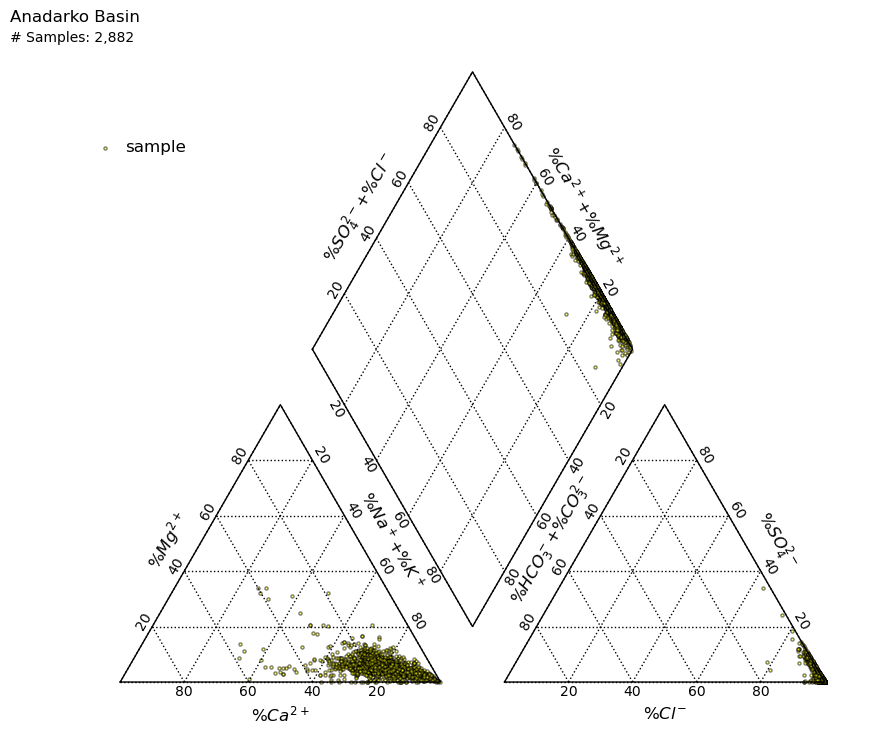

File 'AnadarkoBasin_AllWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 303 samples from the Fort Worth Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



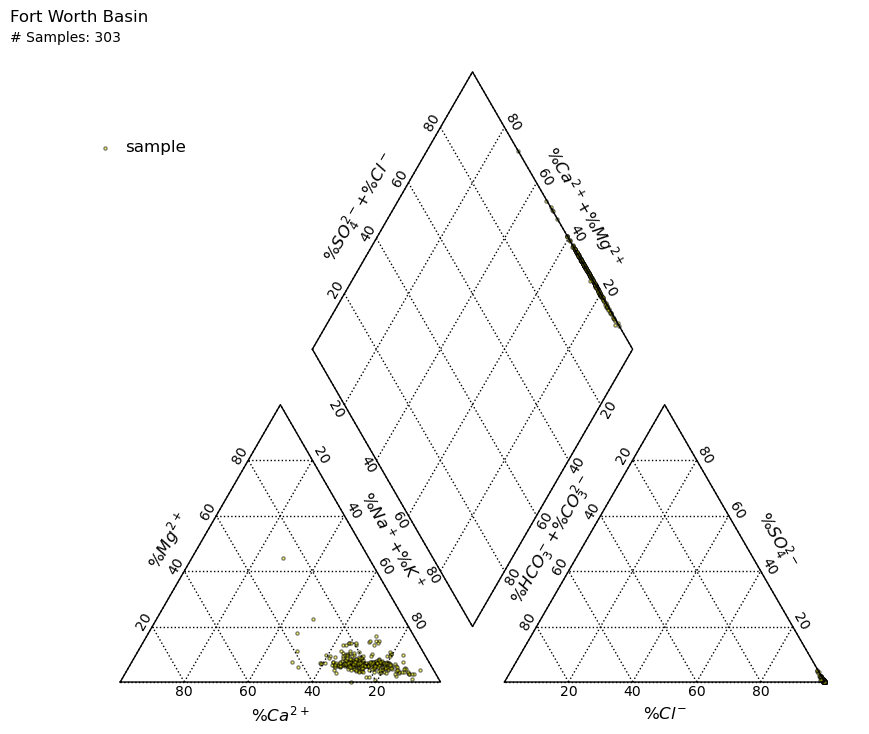

File 'FortWorthBasin_AllWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---


In [23]:
# Generate all basin triangle piper plots
basins = df_filtered_categorized_basin['BASIN_CATEGORY'].unique()

for basin in basins:
    basin = basin
    piper_type = 'triangle'
    image_name = f'{basin.replace(" ", "")}_AllWellSamples_Piper(Triangle)'
    image_type = 'piper'
    generate_single_basin_piper_plot(df_filtered_categorized_basin, basin, piper_type, image_name, image_type)
    

### Generate Contour Piper Plots: Most Recent Sample From Each Well Only

A dataframe called df_wqchartpyformat has been created that contains 8338 samples from the Gulf Coast Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



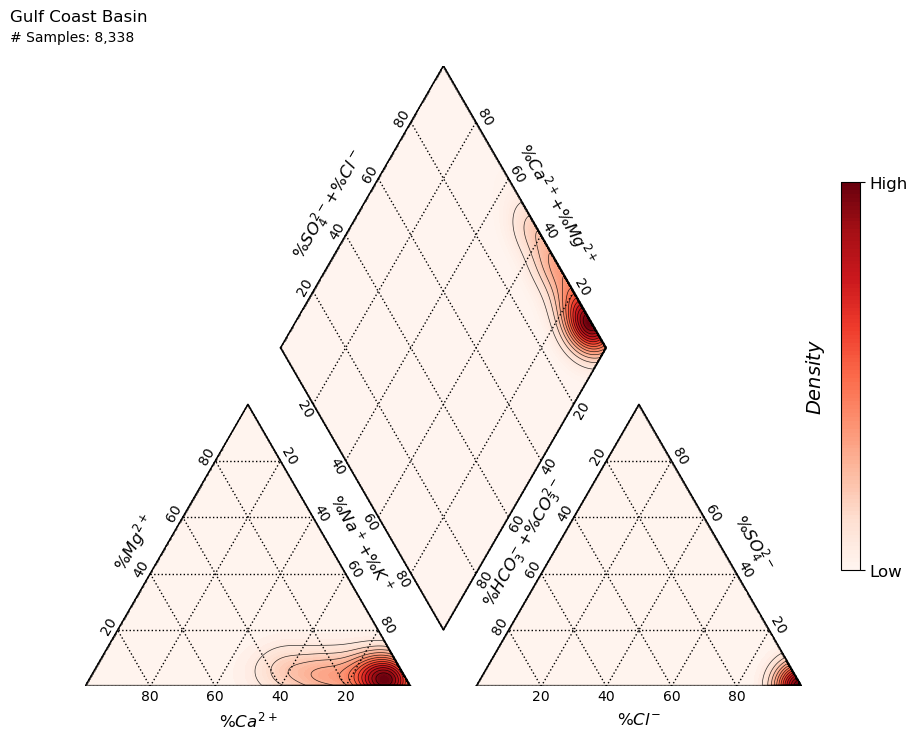

File 'GulfCoastBasin_OnlyMostRecentWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 4421 samples from the Permian Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



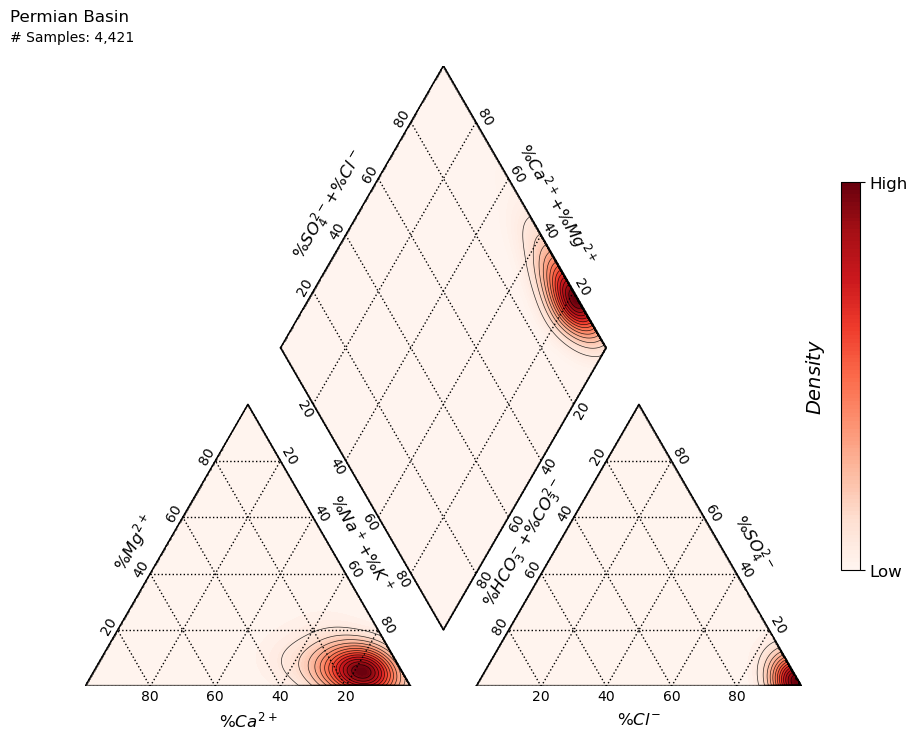

File 'PermianBasin_OnlyMostRecentWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 3600 samples from the Williston Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



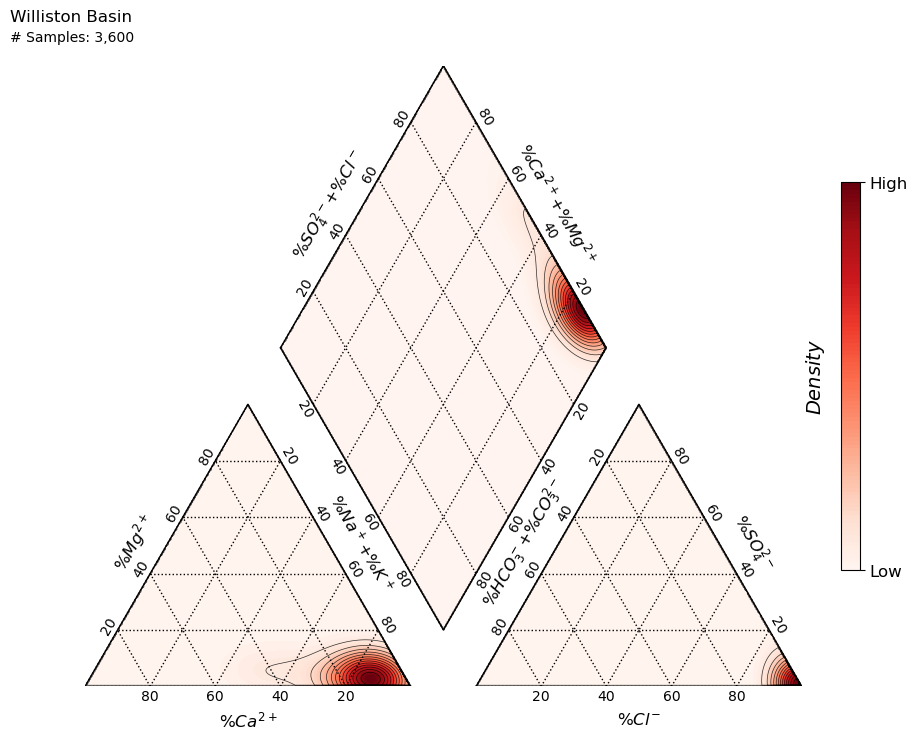

File 'WillistonBasin_OnlyMostRecentWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 1776 samples from the Rocky Mountain Basins.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



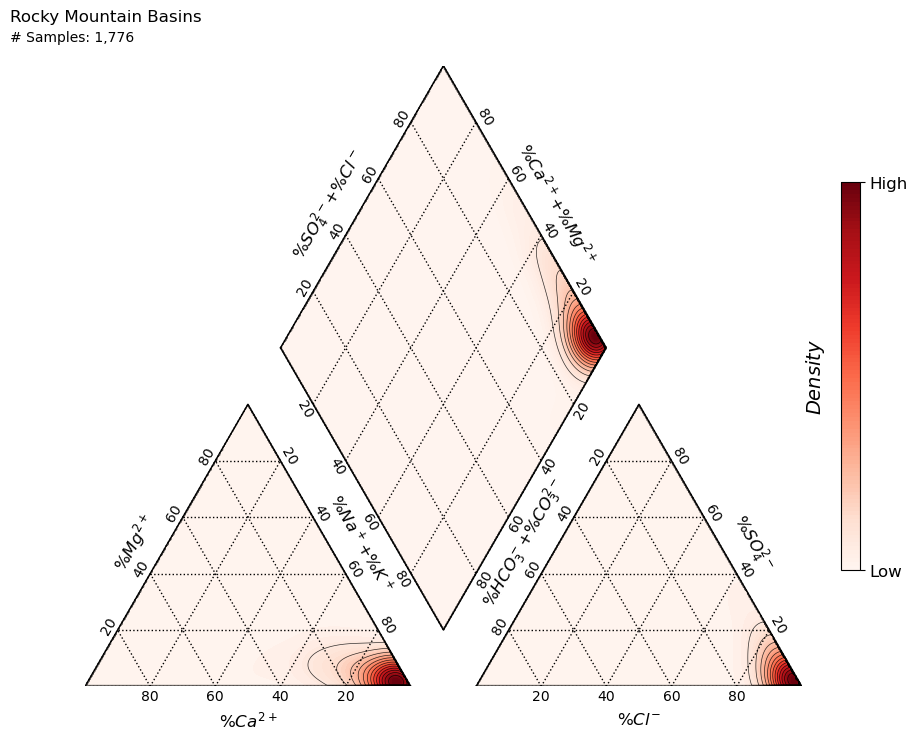

File 'RockyMountainBasins_OnlyMostRecentWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 5929 samples from the Oklahoma Platform Basins.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



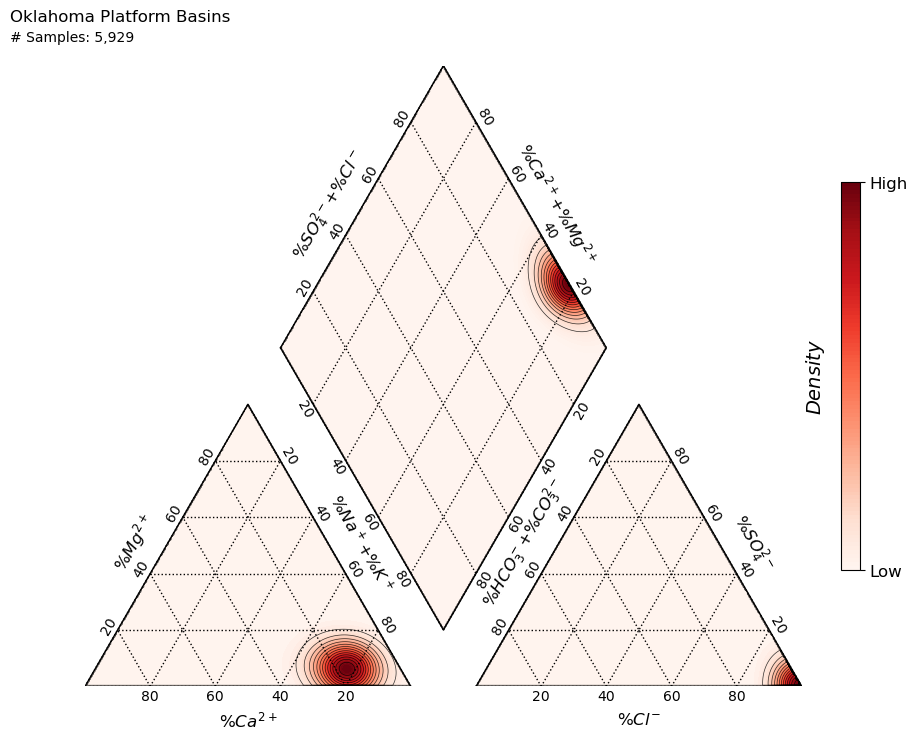

File 'OklahomaPlatformBasins_OnlyMostRecentWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 1488 samples from the Anadarko Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



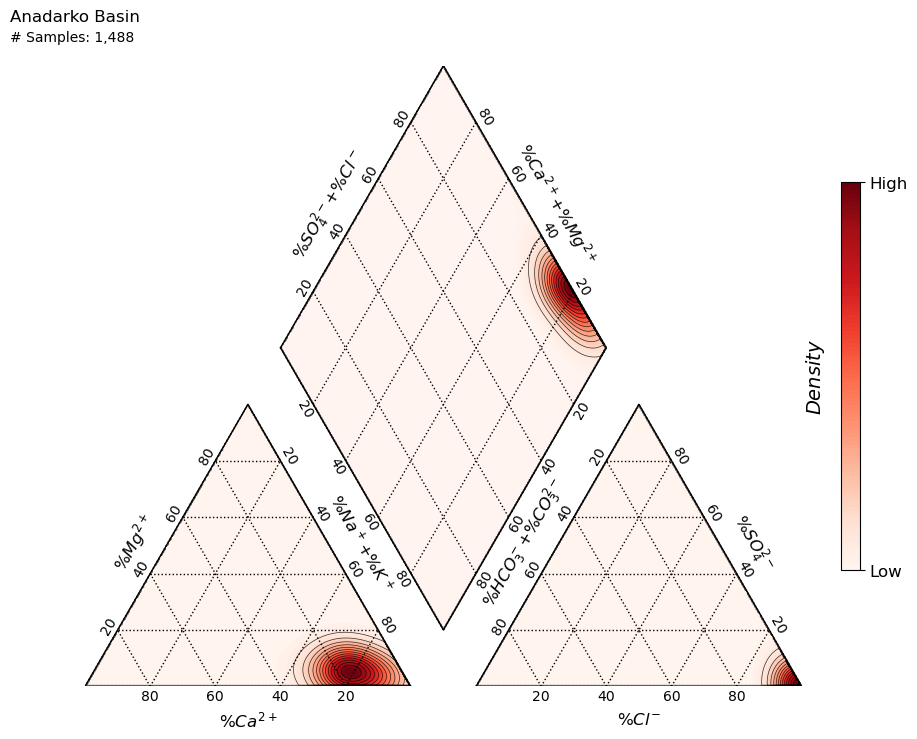

File 'AnadarkoBasin_OnlyMostRecentWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 870 samples from the Illinois Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



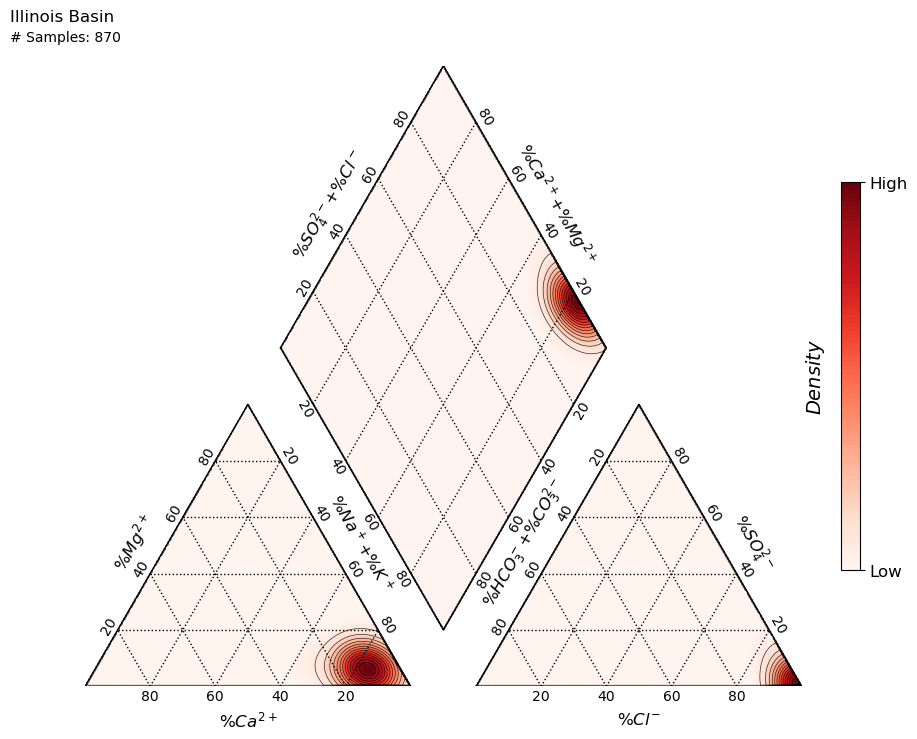

File 'IllinoisBasin_OnlyMostRecentWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 413 samples from the Appalachian Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



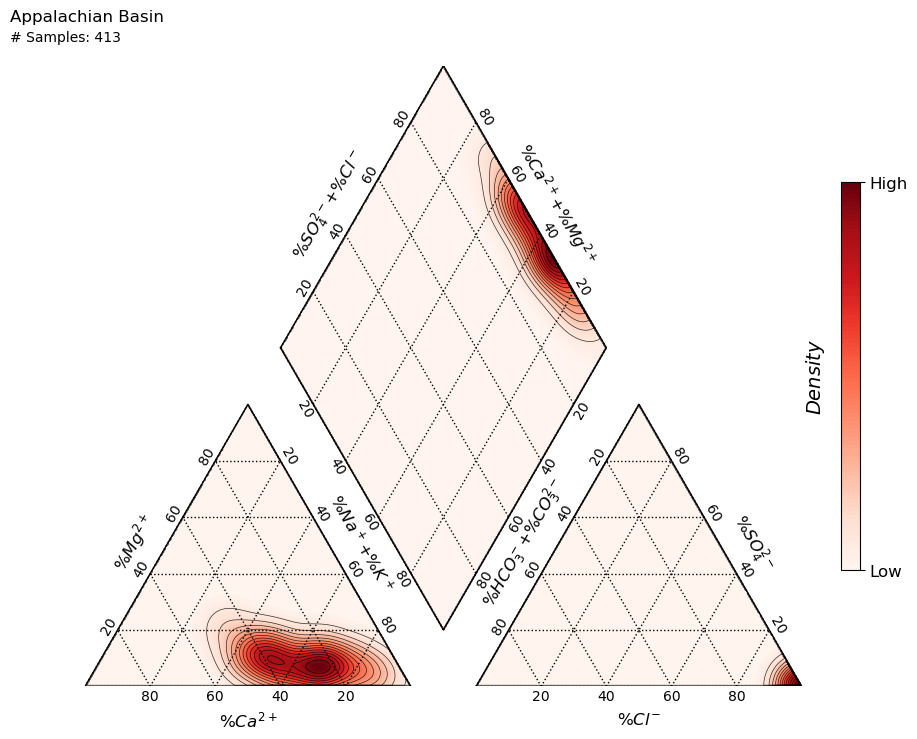

File 'AppalachianBasin_OnlyMostRecentWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 206 samples from the Fort Worth Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



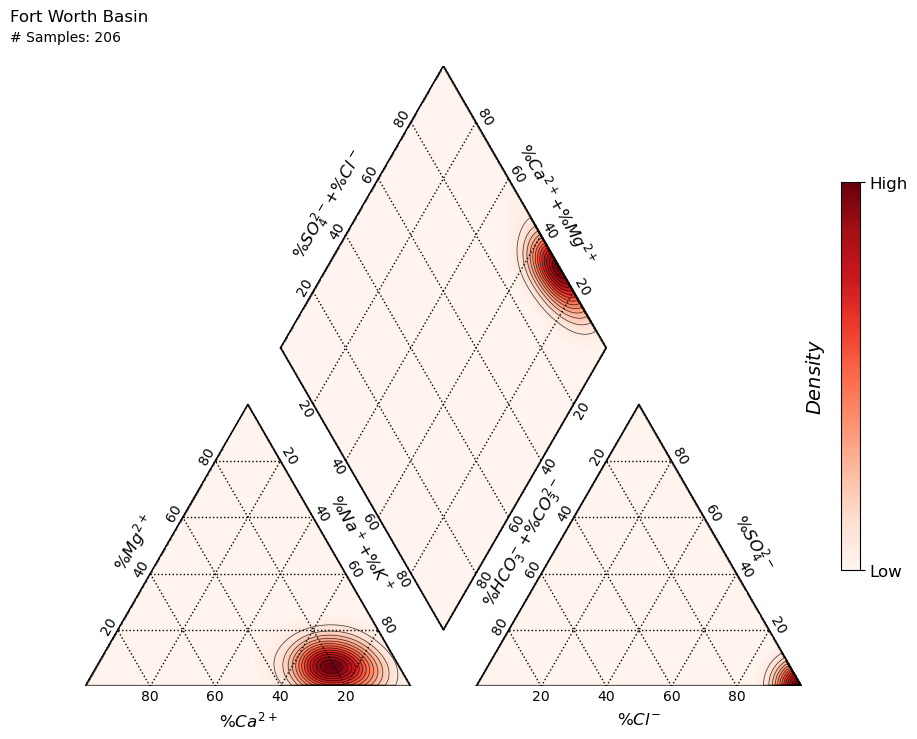

File 'FortWorthBasin_OnlyMostRecentWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 345 samples from the Michigan Basin.
---
Patience please. The piper plot code may take a while to run.
---
Contour-filed Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



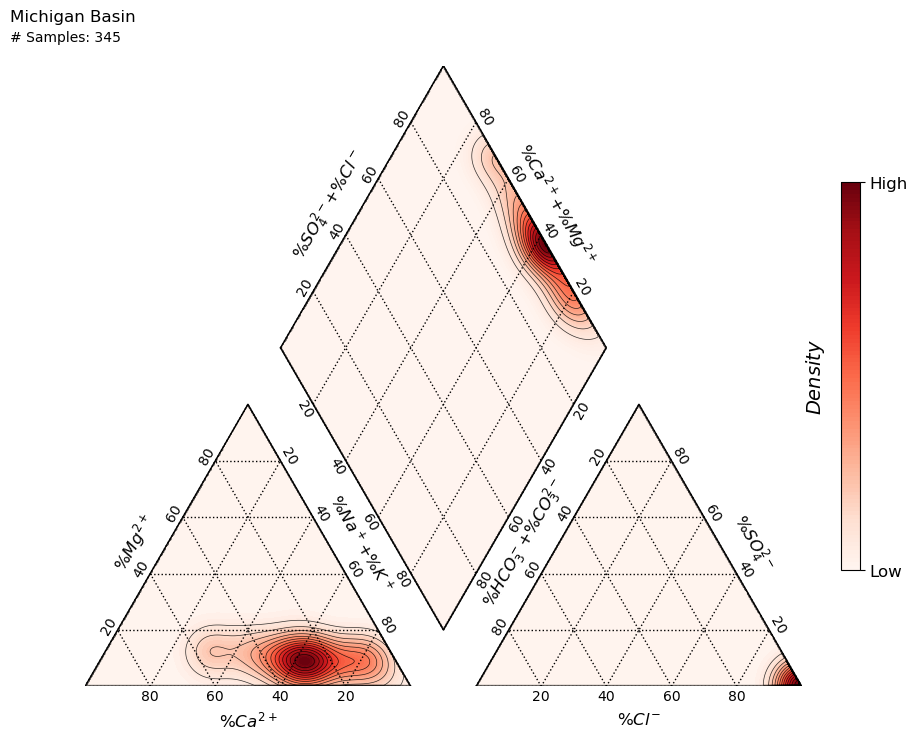

File 'MichiganBasin_OnlyMostRecentWellSamples_Piper(Contour).png' moved to 'images/piper_plots' folder.
---


In [ ]:
# Generate all basin category contour piper plots that includes only the most recent sample from each well
basins = df_filtered_recent_categorized_basin['BASIN_CATEGORY'].unique()

for basin in basins:
    basin = basin
    piper_type = 'contour'
    image_name = f'{basin.replace(" ", "")}_OnlyMostRecentWellSamples_Piper(Contour)'
    image_type = 'piper'
    generate_single_basin_piper_plot(df_filtered_recent_categorized_basin, basin, piper_type, image_name, image_type)


### Generate Colorful Piper Plots: Most Recent Sample From Each Well Only

A dataframe called df_wqchartpyformat has been created that contains 8338 samples from the Gulf Coast Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



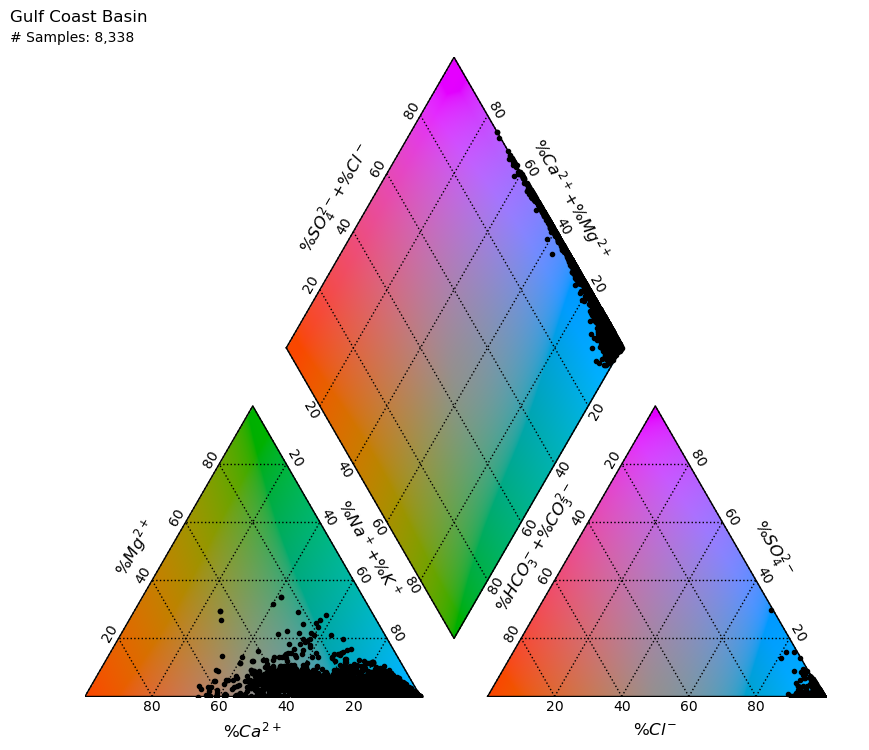

File 'GulfCoastBasin_OnlyMostRecentWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 4421 samples from the Permian Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



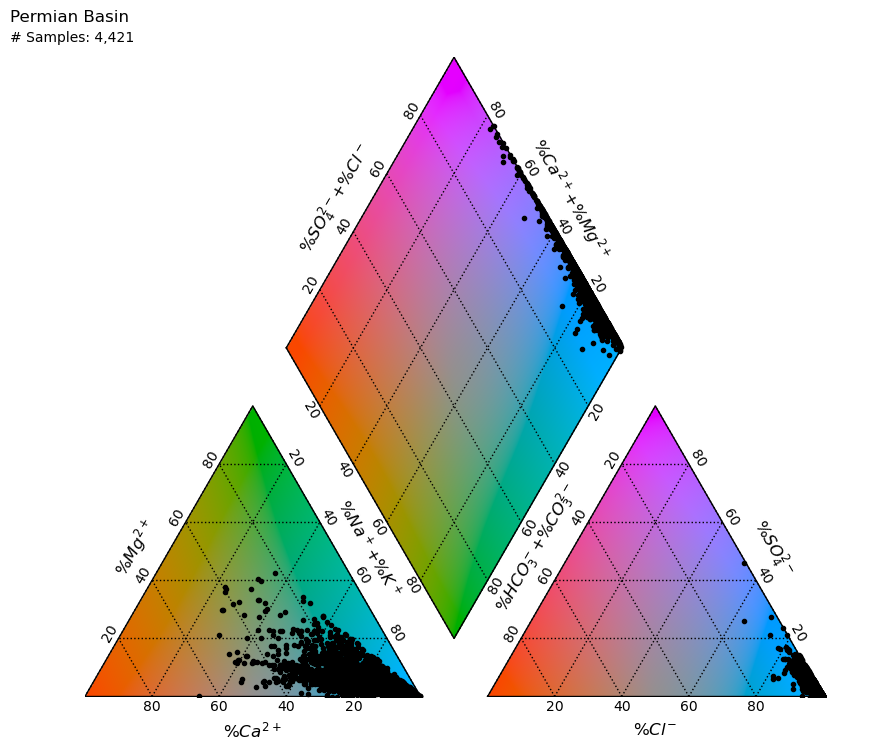

File 'PermianBasin_OnlyMostRecentWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 3600 samples from the Williston Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



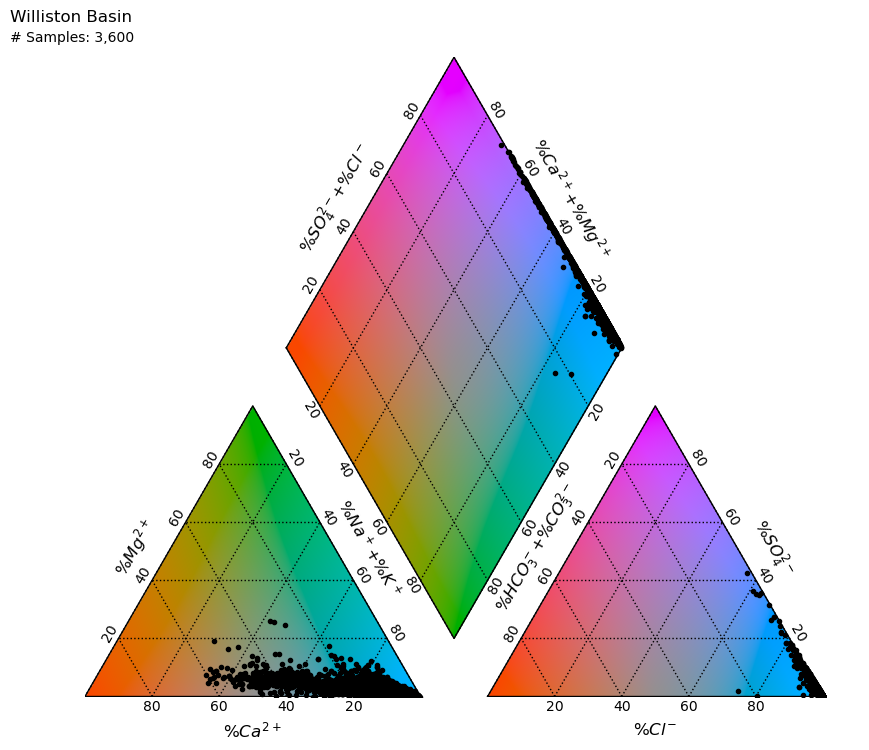

File 'WillistonBasin_OnlyMostRecentWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 1776 samples from the Rocky Mountain Basins.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



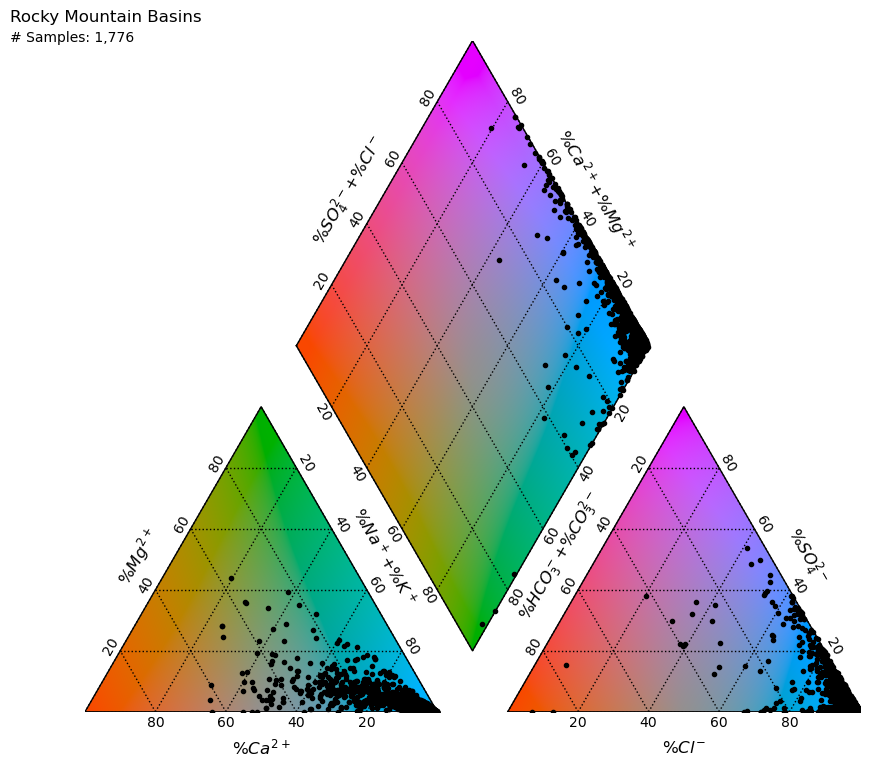

File 'RockyMountainBasins_OnlyMostRecentWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 5929 samples from the Oklahoma Platform Basins.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



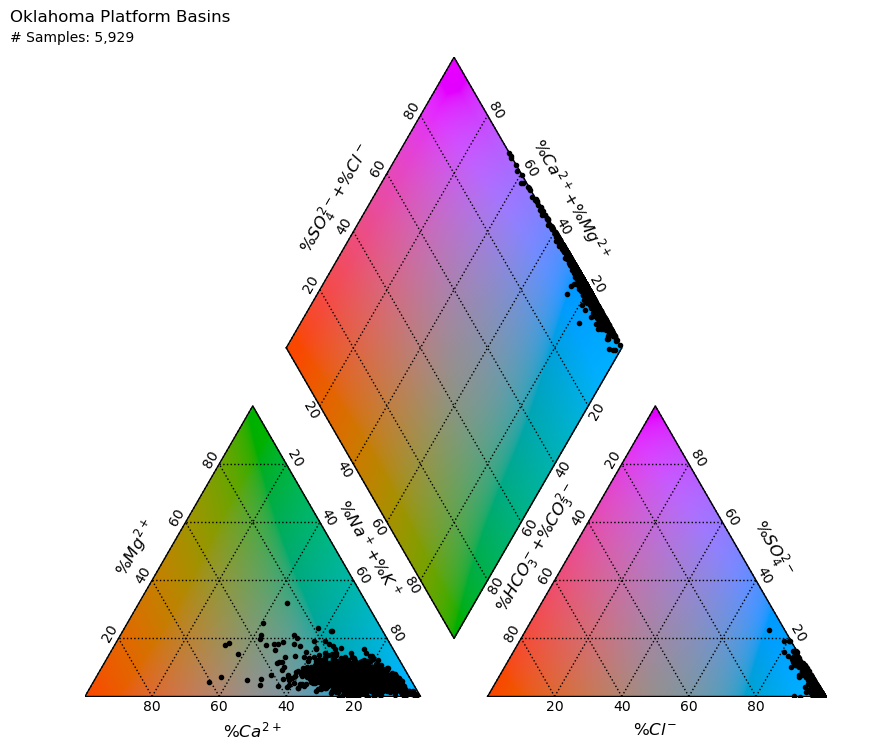

File 'OklahomaPlatformBasins_OnlyMostRecentWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 1488 samples from the Anadarko Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



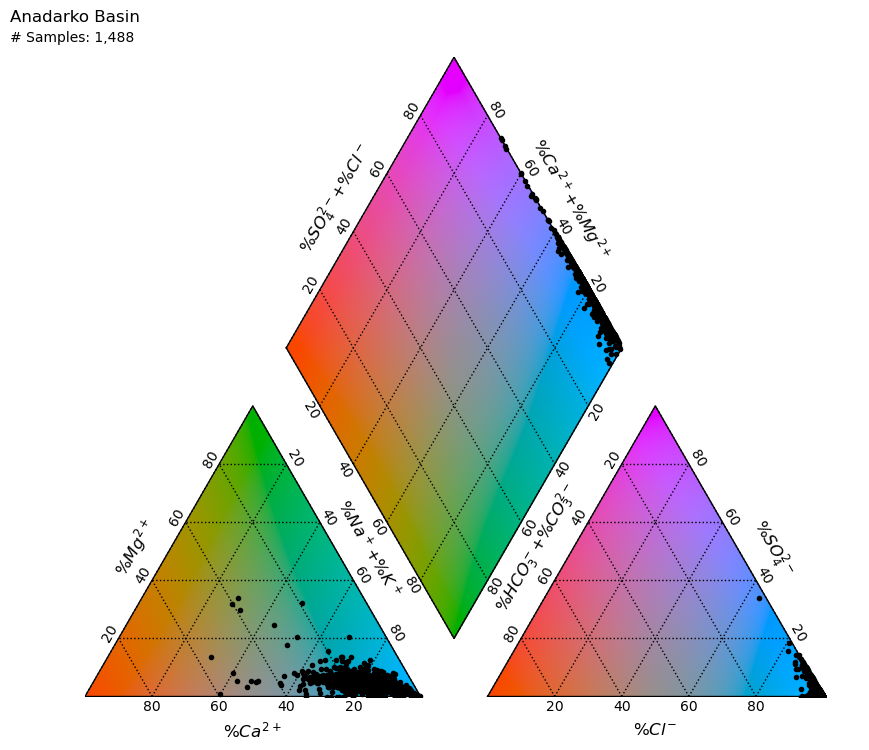

File 'AnadarkoBasin_OnlyMostRecentWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 870 samples from the Illinois Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



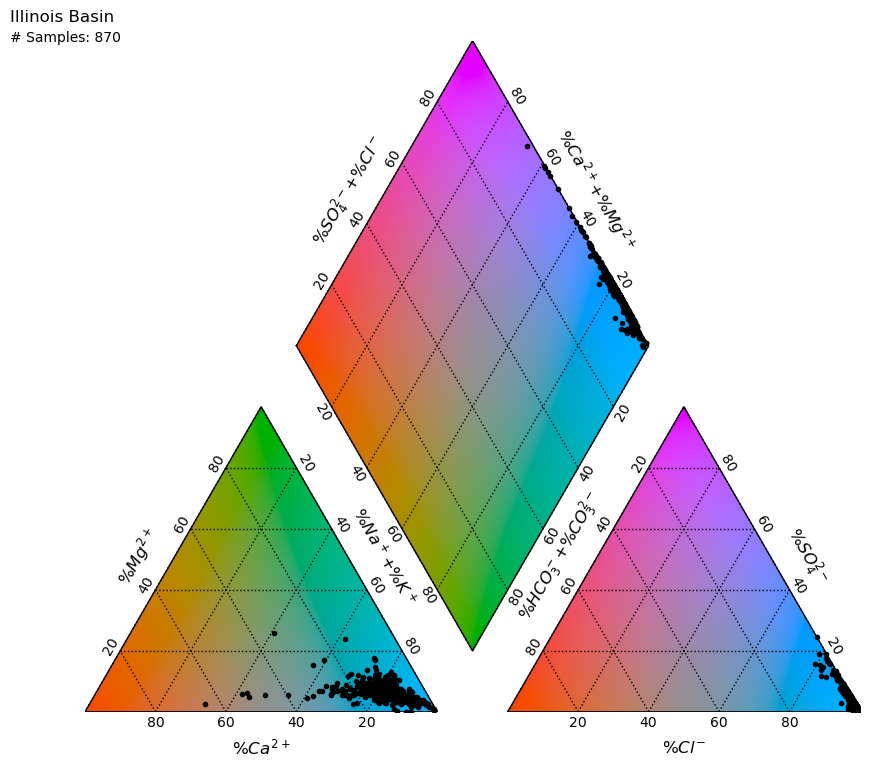

File 'IllinoisBasin_OnlyMostRecentWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 413 samples from the Appalachian Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



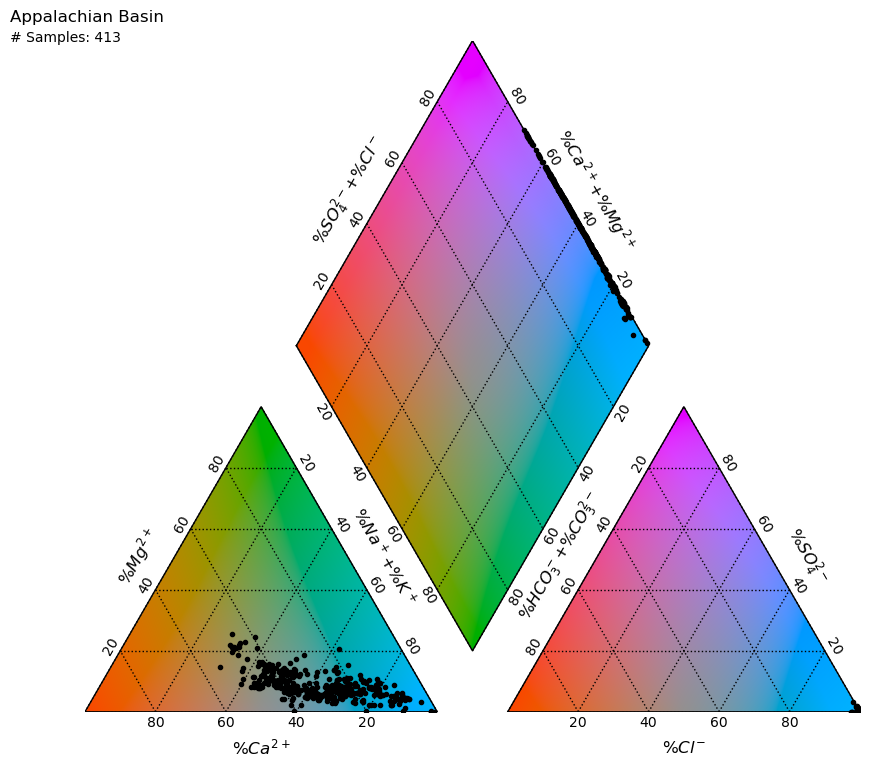

File 'AppalachianBasin_OnlyMostRecentWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 206 samples from the Fort Worth Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



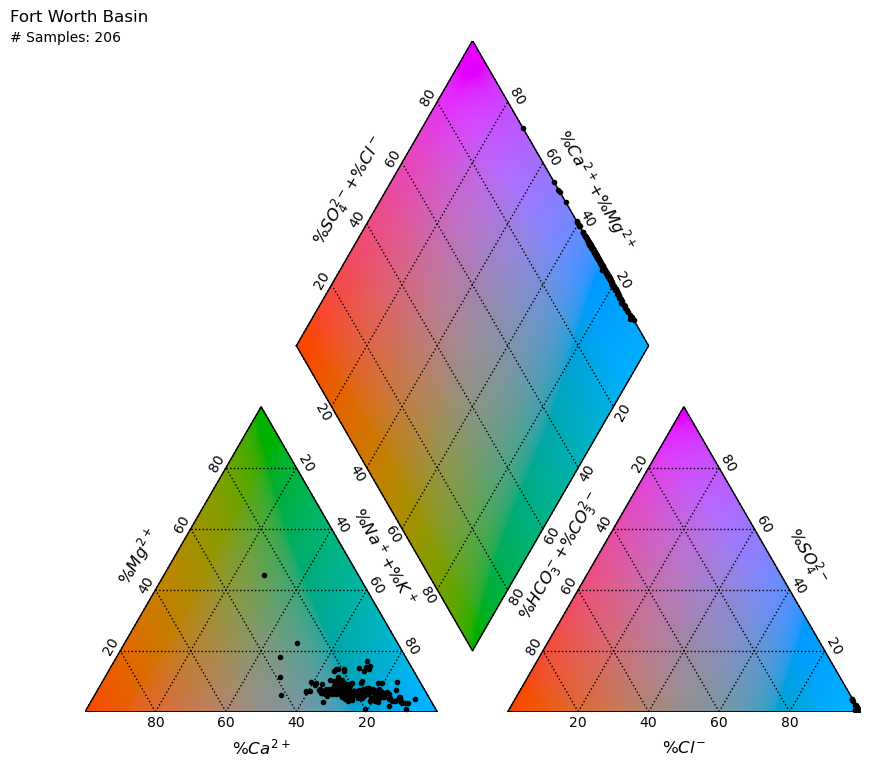

File 'FortWorthBasin_OnlyMostRecentWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 345 samples from the Michigan Basin.
---
Patience please. The piper plot code may take a while to run.
---
Color-coded Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



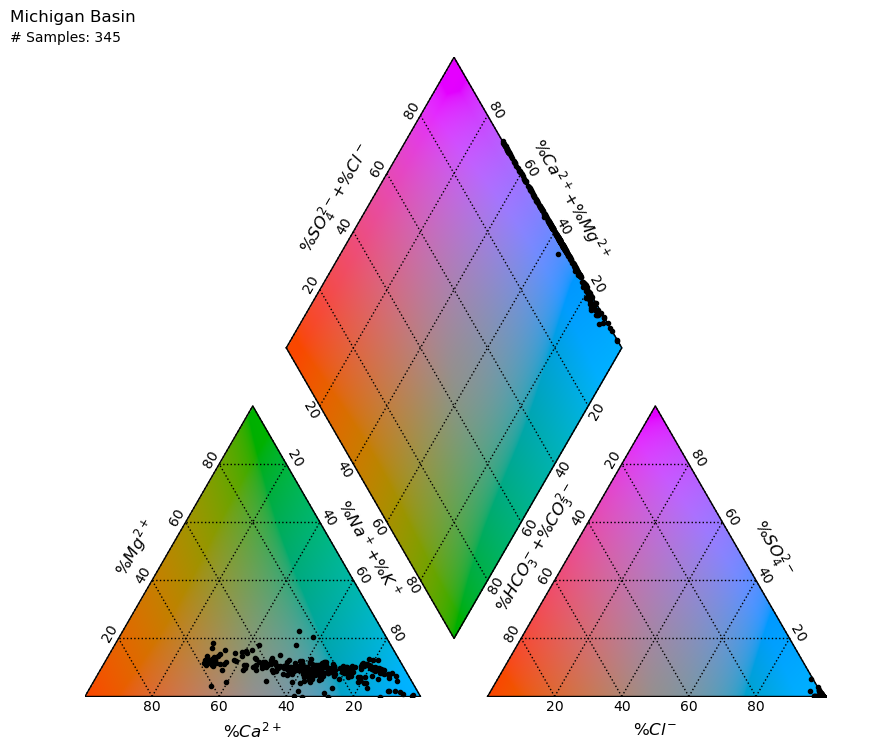

File 'MichiganBasin_OnlyMostRecentWellSamples_Piper(Color).png' moved to 'images/piper_plots' folder.
---


In [ ]:
# Generate all basin category color piper plots that includes only the most recent sample from each well
basins = df_filtered_recent_categorized_basin['BASIN_CATEGORY'].unique()

for basin in basins:
    basin = basin
    piper_type = 'color'
    image_name = f'{basin.replace(" ", "")}_OnlyMostRecentWellSamples_Piper(Color)'
    image_type = 'piper'
    generate_single_basin_piper_plot(df_filtered_recent_categorized_basin, basin, piper_type, image_name, image_type)
    

### Generate Triangle Piper Plots: Most Recent Sample From Each Well Only

A dataframe called df_wqchartpyformat has been created that contains 8338 samples from the Gulf Coast Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



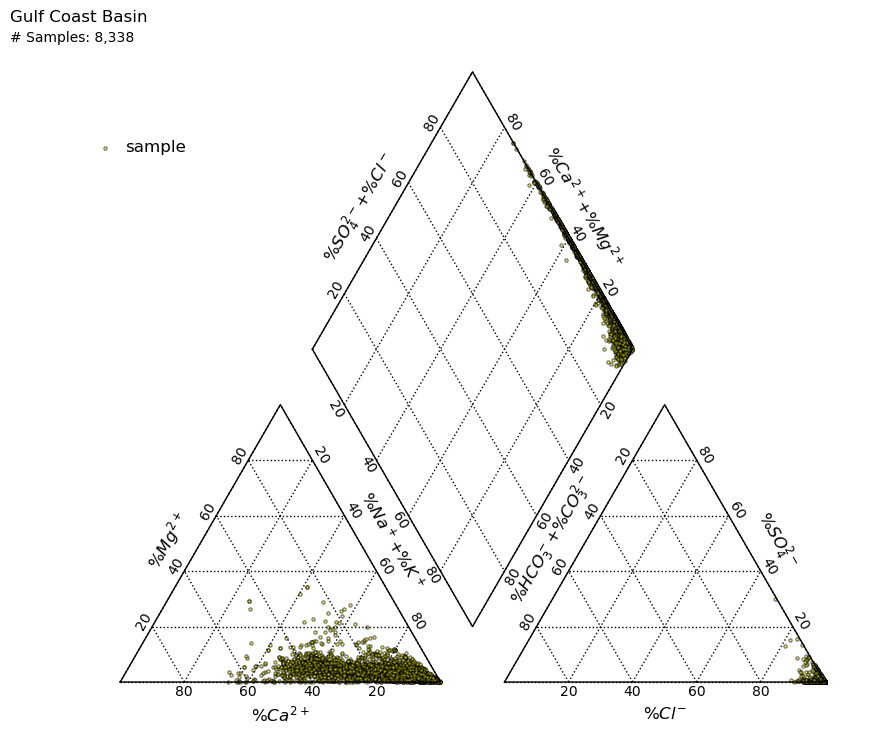

File 'GulfCoastBasin_OnlyMostRecentWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 4421 samples from the Permian Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



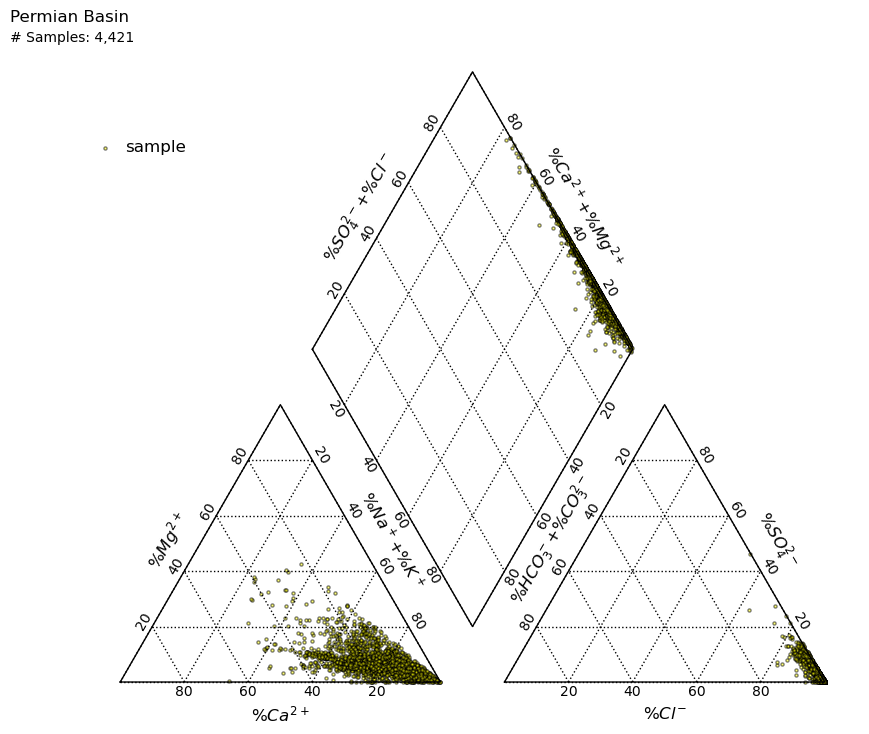

File 'PermianBasin_OnlyMostRecentWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 3600 samples from the Williston Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



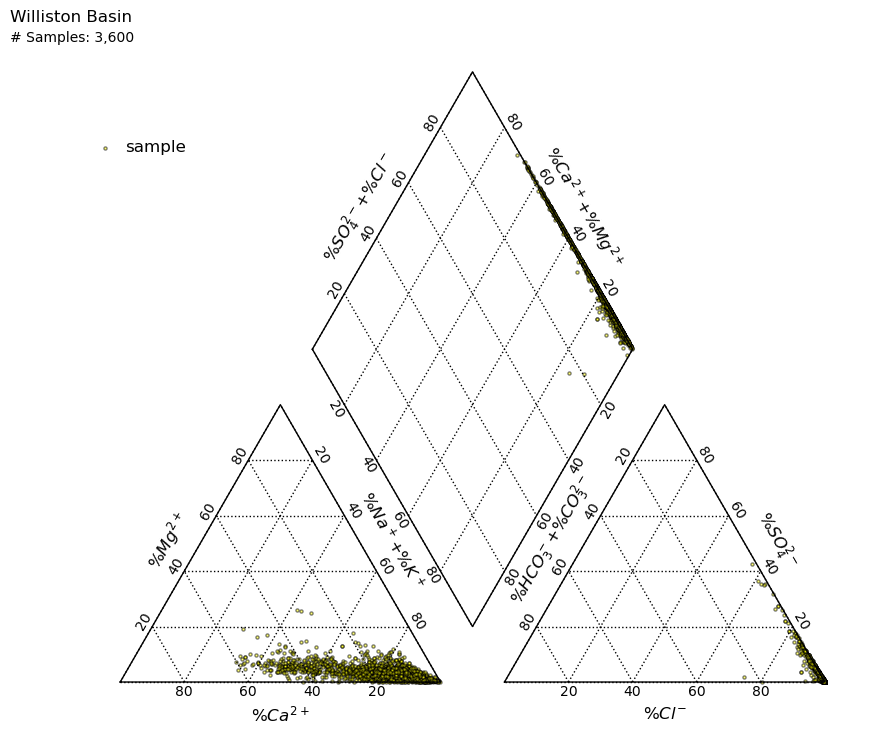

File 'WillistonBasin_OnlyMostRecentWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 1776 samples from the Rocky Mountain Basins.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



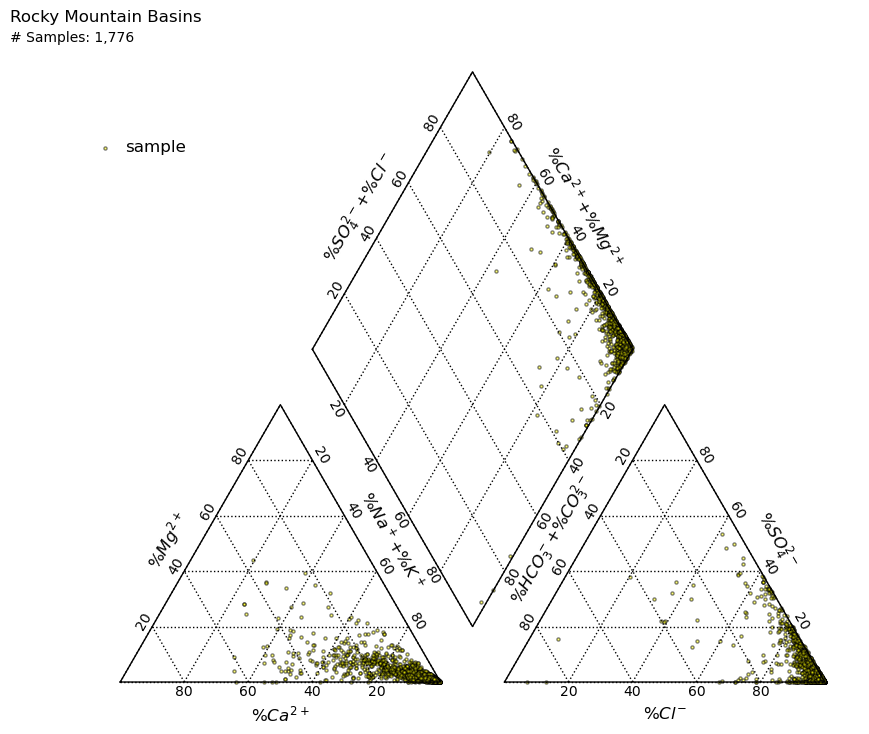

File 'RockyMountainBasins_OnlyMostRecentWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 5929 samples from the Oklahoma Platform Basins.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



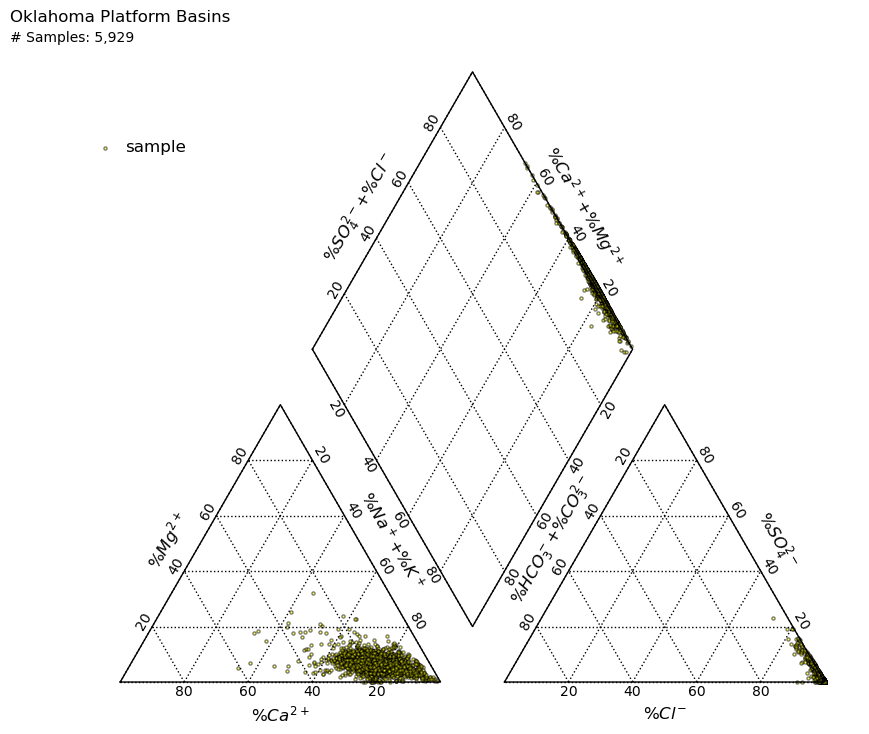

File 'OklahomaPlatformBasins_OnlyMostRecentWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 1488 samples from the Anadarko Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



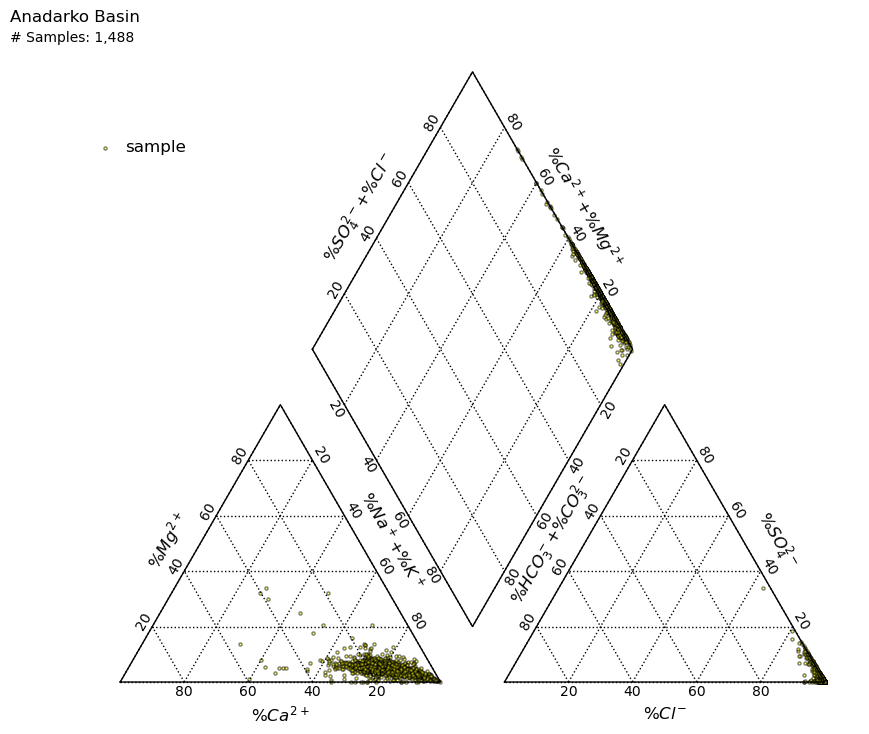

File 'AnadarkoBasin_OnlyMostRecentWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 870 samples from the Illinois Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



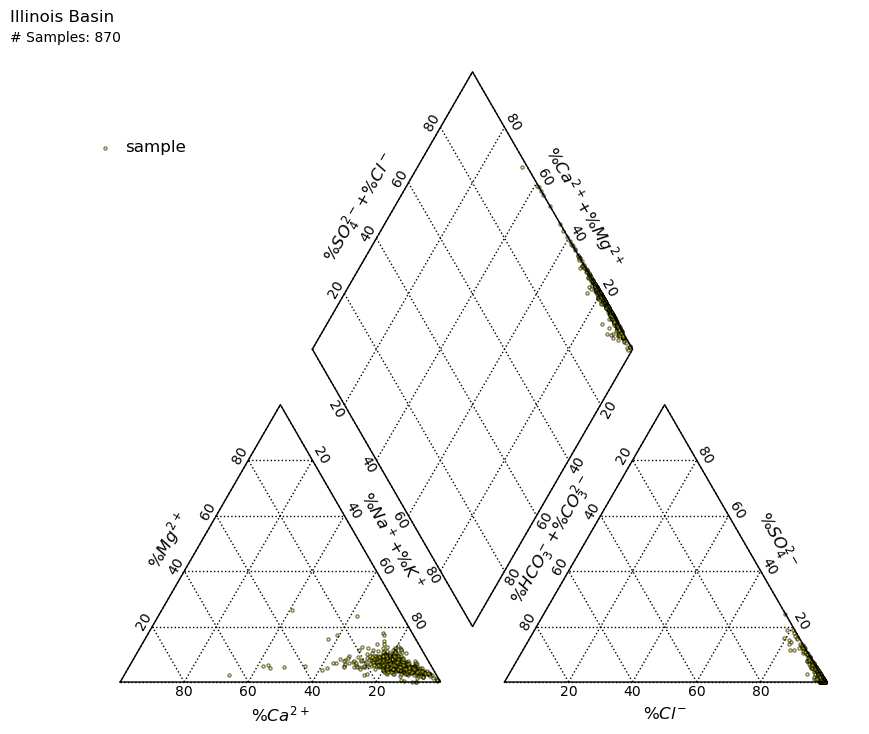

File 'IllinoisBasin_OnlyMostRecentWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 413 samples from the Appalachian Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



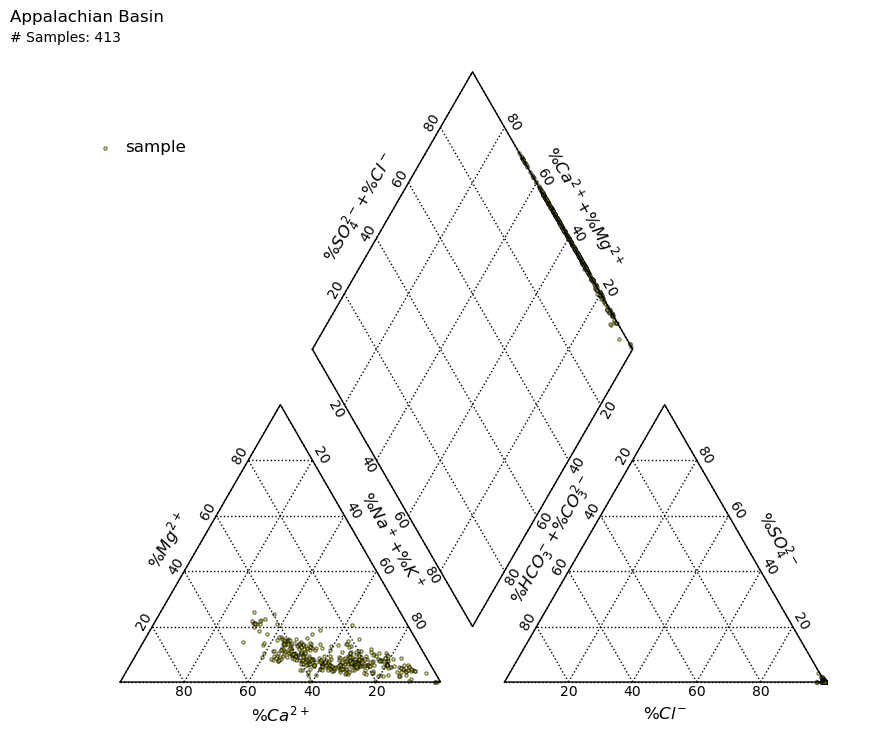

File 'AppalachianBasin_OnlyMostRecentWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 206 samples from the Fort Worth Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



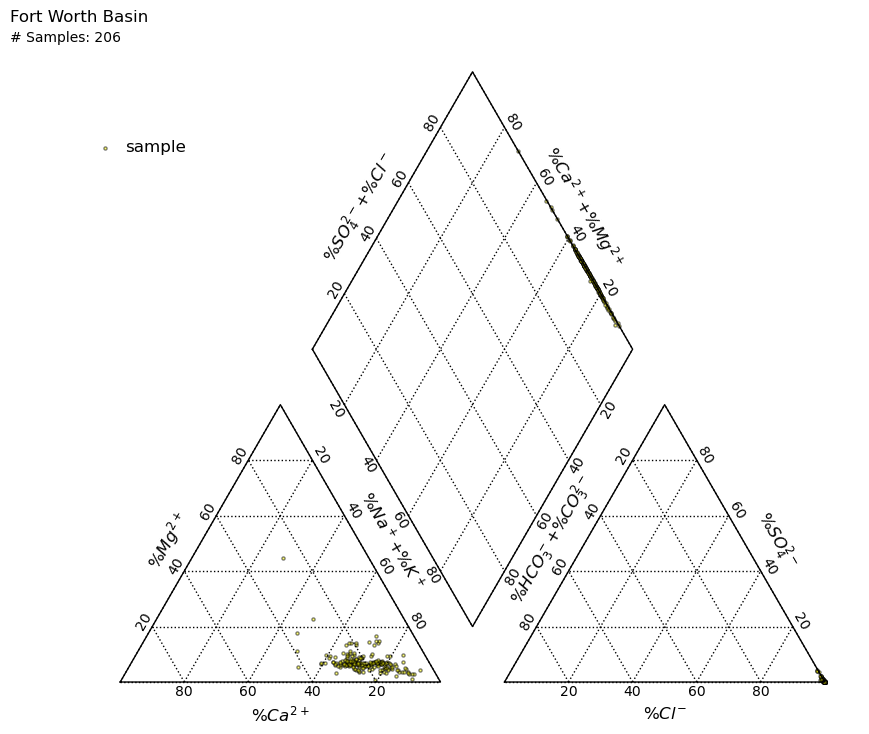

File 'FortWorthBasin_OnlyMostRecentWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---
A dataframe called df_wqchartpyformat has been created that contains 345 samples from the Michigan Basin.
---
Patience please. The piper plot code may take a while to run.
---
Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



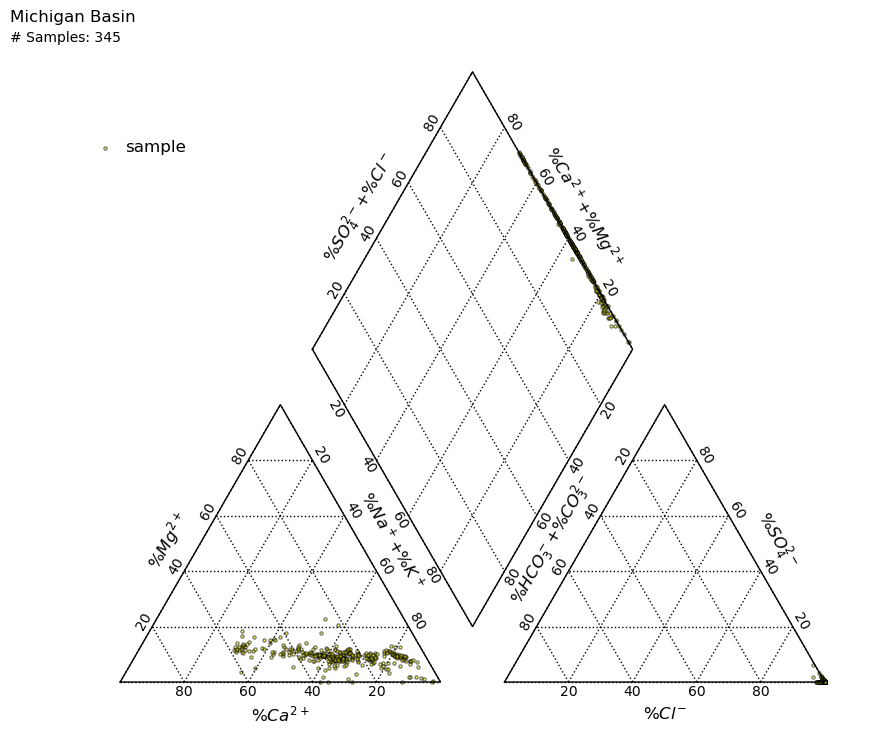

File 'MichiganBasin_OnlyMostRecentWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---


In [24]:
# Generate all basin category triangle piper plots that includes only the most recent sample from each well
basins = df_filtered_recent_categorized_basin['BASIN_CATEGORY'].unique()

for basin in basins:
    basin = basin
    piper_type = 'triangle'
    image_name = f'{basin.replace(" ", "")}_OnlyMostRecentWellSamples_Piper(Triangle)'
    image_type = 'piper'
    generate_single_basin_piper_plot(df_filtered_recent_categorized_basin, basin, piper_type, image_name, image_type)


### Generate Single Triangle Piper Plot with Target Basin Samples Color-Coded

Trilinear Piper plot created. Saving it to /Users/brittanysmacbookair/GitHub Repository Clones/Project1/notebooks 



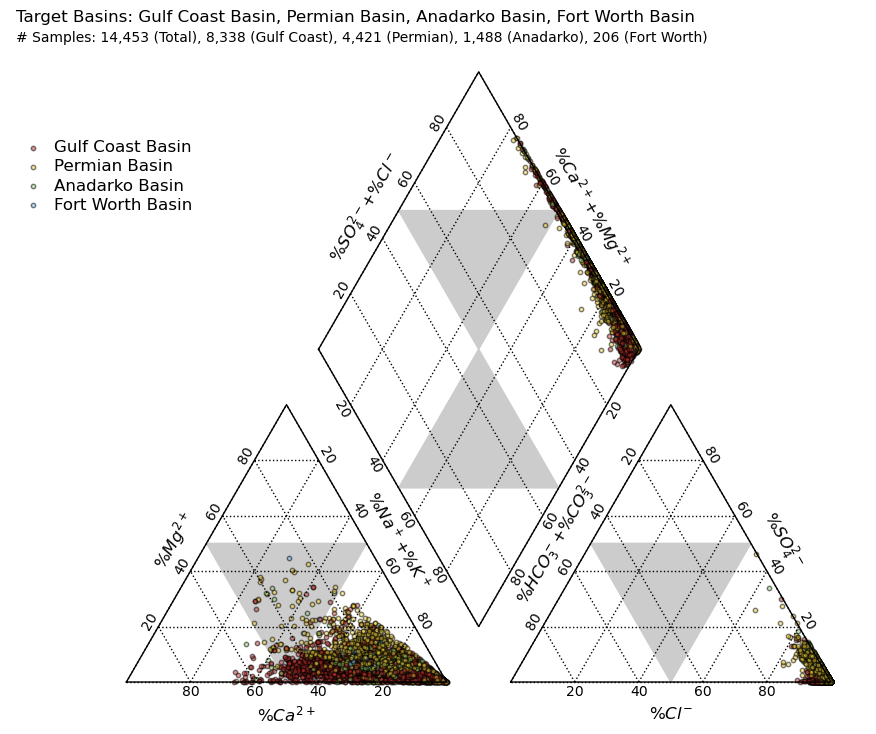

File 'AllTargetBasins_OnlyMostRecentWellSamples_Piper(Triangle).png' moved to 'images/piper_plots' folder.
---


In [26]:
# Filter dataframe to only show the target basins
target_basins = ['Gulf Coast Basin', 'Permian Basin', 'Anadarko Basin', 'Fort Worth Basin']
mask = df_filtered_recent_categorized_basin['BASIN_CATEGORY'].isin(target_basins)
df_filtered_recent_target_basins = df_filtered_recent_categorized_basin[mask]

# Create new dataframe to match format required by wqchartpy for the contour piper plot
df_wqchartpyformat = pd.DataFrame()
df_wqchartpyformat['Sample'] = df_filtered_recent_target_basins['IDUSGS'].map(str)
df_wqchartpyformat['Label'] = df_filtered_recent_target_basins['BASIN_CATEGORY'].map(str)
df_wqchartpyformat['Marker'] = 'o'
df_wqchartpyformat.loc[df_wqchartpyformat['Label']=='Gulf Coast Basin', 'Color'] = '#BA2F29'
df_wqchartpyformat.loc[df_wqchartpyformat['Label']=='Permian Basin', 'Color'] = '#E9C832'
df_wqchartpyformat.loc[df_wqchartpyformat['Label']=='Anadarko Basin', 'Color'] = '#89C667'
df_wqchartpyformat.loc[df_wqchartpyformat['Label']=='Fort Worth Basin', 'Color'] = '#67ACE6'
df_wqchartpyformat['Size'] = 10
df_wqchartpyformat['Alpha'] = 0.5

elements = ['Ca', 'Mg', 'Na', 'K', 'HCO3', 'CO3', 'Cl', 'SO4']
for element in elements:
    df_wqchartpyformat[element] = df_filtered_recent_target_basins[element]

# Reset the index
df_wqchartpyformat.reset_index(inplace=True, drop=True)

'''----------------------------------------'''

# Generate all basin category triangle piper plots that includes only the most recent sample from each well

image_name = f'AllTargetBasins_OnlyMostRecentWellSamples_Piper(Triangle)'
triangle_piper.plot(df_wqchartpyformat,unit='mg/L',figname=image_name,figformat='png')

plt.text(0.05, 0.85, f'Target Basins: {target_basins[0]}, {target_basins[1]}, {target_basins[2]}, {target_basins[3]}', color='black', fontsize=12, ha='left', transform=plt.gcf().transFigure)
plt.text(0.05, 0.83, f"# Samples: {len(df_wqchartpyformat):,} (Total), {df_wqchartpyformat['Label'].value_counts().get('Gulf Coast Basin', 0):,} (Gulf Coast), {df_wqchartpyformat['Label'].value_counts().get('Permian Basin', 0):,} (Permian), {df_wqchartpyformat['Label'].value_counts().get('Anadarko Basin', 0):,} (Anadarko), {df_wqchartpyformat['Label'].value_counts().get('Fort Worth Basin', 0):,} (Fort Worth)", 
         color='black', fontsize=10, ha='left', transform=plt.gcf().transFigure)

plt.savefig(f'{image_name}.png', format='png', bbox_inches='tight', dpi=300)
plt.show()

image_file_name = f'{image_name}.png'
image_type = 'piper'
move_image_file_to_images_folder(image_file_name, image_type)


### Geo Plots